# Utils

Some helpful utilities when dealing with the IASI data.

In [1]:
import sys, os
from pyprojroot import here

# spyder up to find the root
import sys, os

sys.path.append("/home/emmanuel/code/isp_data")
sys.path.append("/home/emmanuel/code/gp_model_zoo/code/numpyro")

import jax.numpy as jnp
import numpy as np
import xarray as xr
# 
from isp_data.iasi.utils import get_orbits, get_radiance_covariance, get_clean_features
from isp_data.iasi.load_data import load_radiances

# MATPLOTLIB Settings
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# SEABORN SETTINGS
from tqdm.notebook import tqdm
import seaborn as sns
sns.set_context(context='talk',font_scale=0.7)

%load_ext autoreload
%autoreload 2

#### Get All Orbits

In [2]:
# ==========================
# INITIALIZE LOGGER
# ==========================
import wandb

wandb_logger = wandb.init(project="egp_1_1", entity="ipl_uv")

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: ml4floods (use `wandb login --relogin` to force relogin)
wandb: wandb version 0.10.32 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [3]:
wandb.config.model = "sparse"
wandb.config.exp = "iasi"
wandb.config.n_train = 5_000
wandb.config.n_components = 50

In [4]:
orbits = get_orbits()
orbits.head(10)

,IASI Dates
0,20130717031453
1,20130717045652
2,20130717063852
3,20130717082052
4,20130717132052
5,20130717150252
6,20130717164156
7,20130717182356
8,20130717214452
9,20130731233555


#### Get Orbits for a specific Data

In [5]:
day = ['20131001'] # "20140117", "20140101", "20131001"
wandb.config.day = day[0]
orbits = get_orbits(days=day)
orbits

,IASI Dates
0,20131001015955
1,20131001034155
2,20131001052355
3,20131001070555
4,20131001084755
5,20131001102955
6,20131001120859
7,20131001135058
8,20131001152954
9,20131001170858


## Reflectance Errors

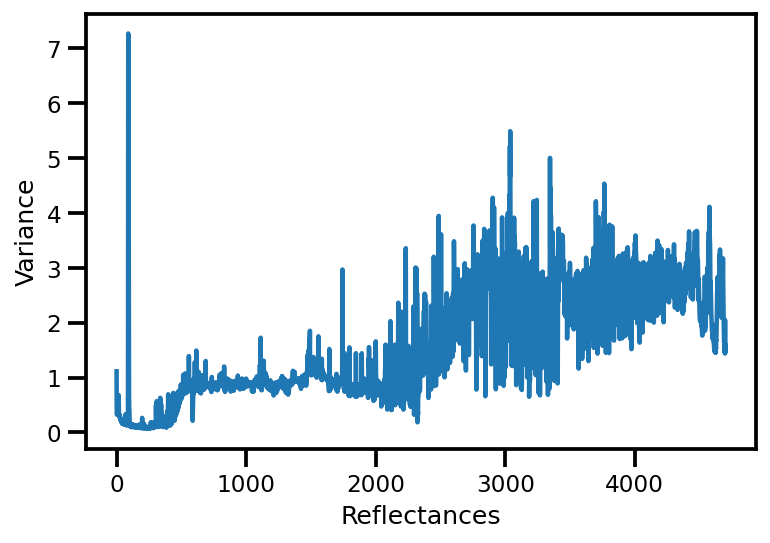

In [6]:
err = get_radiance_covariance(clean_features=True)

fig, ax = plt.subplots()
ax.plot(err)
ax.set(xlabel="Reflectances", ylabel="Variance")
plt.show()

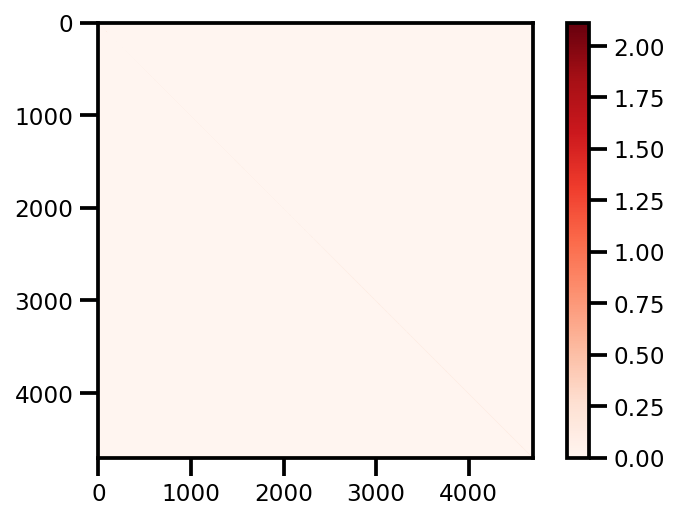

In [7]:
input_cov = np.diag(err)

fig, ax = plt.subplots()
img = ax.imshow(np.log(1+input_cov), cmap="Reds")
plt.colorbar(img)
plt.show()

In [8]:
n_train = 10_000

n_per_orbit = n_train//len(orbits)


In [9]:
from isp_data.iasi.load_data import load_coordinates
from isp_data.iasi.load_data import load_labels

In [10]:

rng = np.random.RandomState(123)
seeds = rng.randint(low=0, high=100_000, size=len(orbits.values))

In [11]:
%%time
import tqdm
import numpy as np

radiances = []
temperatures = []
pressures = []
latitudes = []
longitudes = []

with tqdm.tqdm(list(zip(orbits.values, seeds))) as pbar:
    for iorbit, iseed in pbar:
        pbar.set_description(f"Orbit: {iorbit[0]} | Loading Radiances...")
        dat = load_radiances(orbit=iorbit[0], subsample=n_per_orbit, clean=True, random_state=iseed)
        radiances.append(dat)
        
        pbar.set_description(f"Orbit: {iorbit[0]} | Loading Pressures...")
        dat = load_labels(orbit=iorbit[0], label="hPa", subsample=n_per_orbit, random_state=iseed)
        pressures.append(dat)
        
        pbar.set_description(f"Orbit: {iorbit[0]} | Loading Temperatures...")
        dat = load_labels(orbit=iorbit[0], label="T", subsample=n_per_orbit, random_state=iseed)
        temperatures.append(dat)
        
        pbar.set_description(f"Orbit: {iorbit[0]} | Loading Coordinates...")
        lon, lat  = load_coordinates(orbit=iorbit[0], subsample=n_per_orbit, random_state=iseed)
        latitudes.append(lat)
        longitudes.append(lon)
        
        
radiances = np.concatenate(radiances, axis=0)
temperatures = np.concatenate(temperatures, axis=0)
pressures = np.concatenate(pressures, axis=0)
latitudes = np.concatenate(latitudes, axis=0)
longitudes = np.concatenate(longitudes, axis=0)

Orbit: 20131001221154 | Loading Coordinates...: 100%|██████████| 13/13 [00:28<00:00,  2.22s/it] 


CPU times: user 28.5 s, sys: 531 ms, total: 29 s
Wall time: 29 s


In [12]:
def create_xr_from_df(labels, lats, lons, time=None):
    
    labels = labels.squeeze()
    lats = lats.squeeze()
    lons = lons.squeeze()
    
    if time:
        # create dataframe
        df = pd.DataFrame({"latitude": lats, "longitude": lons, "time": time, "labels": labels})

        # set index
        df = df.set_index(["latitude", "longitude", "time"])
    else:
        # create dataframe
        df = pd.DataFrame({"latitude": lats, "longitude": lons, "labels": labels})

        # set index
        df = df.set_index(["latitude", "longitude"])
    
    # drop duplicates
    df = df.groupby(level=df.index.names).mean()
    # create xarray
    xr_ds = df.to_xarray()
    return xr_ds

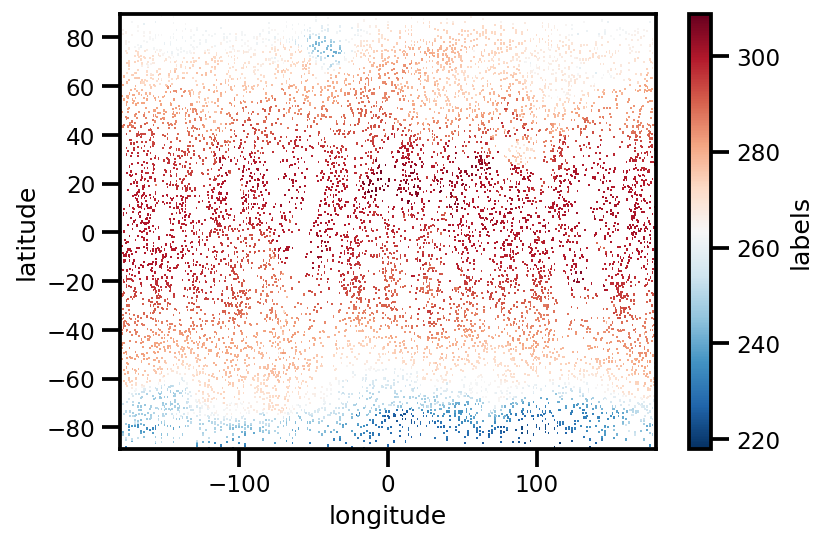

In [13]:
import pandas as pd
dat_xr = create_xr_from_df(temperatures[:, -1], latitudes, longitudes)
dat_xr.labels.plot(cmap="RdBu_r")

In [14]:
y = temperatures[:, -1]

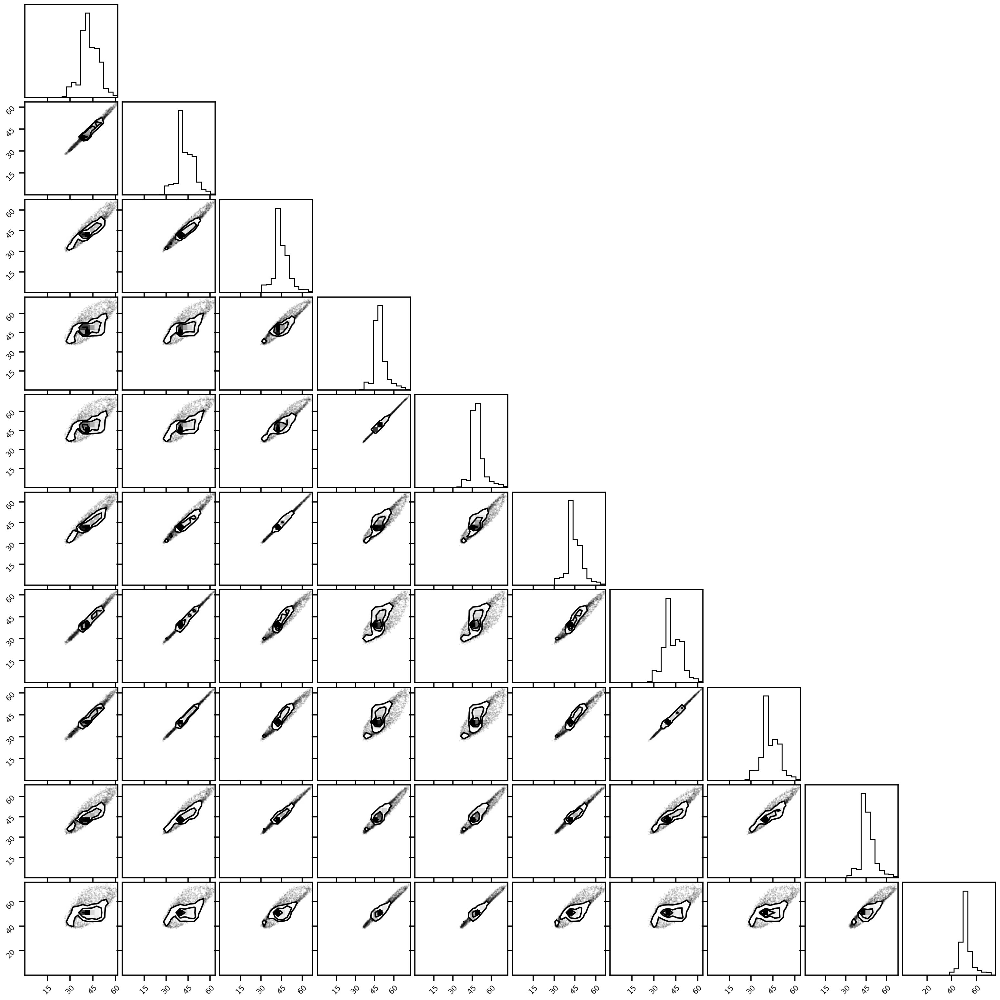

In [15]:
import corner

figure = corner.corner(radiances[:, :10])

## PreProcessing

#### Labels - Standardization

In [16]:
from sklearn.preprocessing import StandardScaler

y_transformer = StandardScaler()

# radiances_scaled = x_transformer.fit_transform(radiances)
y_scaled = y_transformer.fit_transform(y.reshape(-1, 1))

In [17]:
# import corner

# figure = corner.corner(radiances_scaled[:, :10])

#### Inputs - PCA Transformation

In [18]:
from sklearn.decomposition import PCA

In [19]:
%%time
n_components = wandb.config.n_components
pca_seed = 123
pca_scaler = PCA(n_components=10, random_state=pca_seed, whiten=True).fit(radiances)

radiances_pca = pca_scaler.transform(radiances)

CPU times: user 12.6 s, sys: 8.17 s, total: 20.8 s
Wall time: 1.24 s


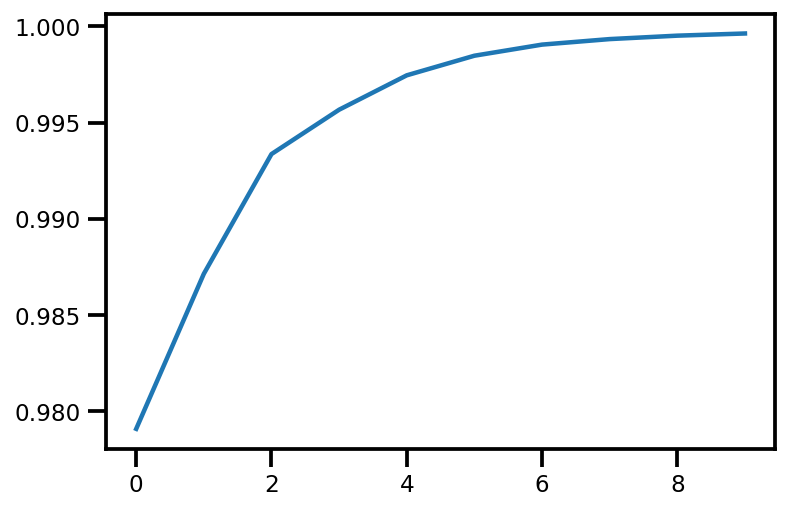

In [20]:
fig, ax = plt.subplots()
ax.plot(np.cumsum(pca_scaler.explained_variance_ratio_))
plt.show()

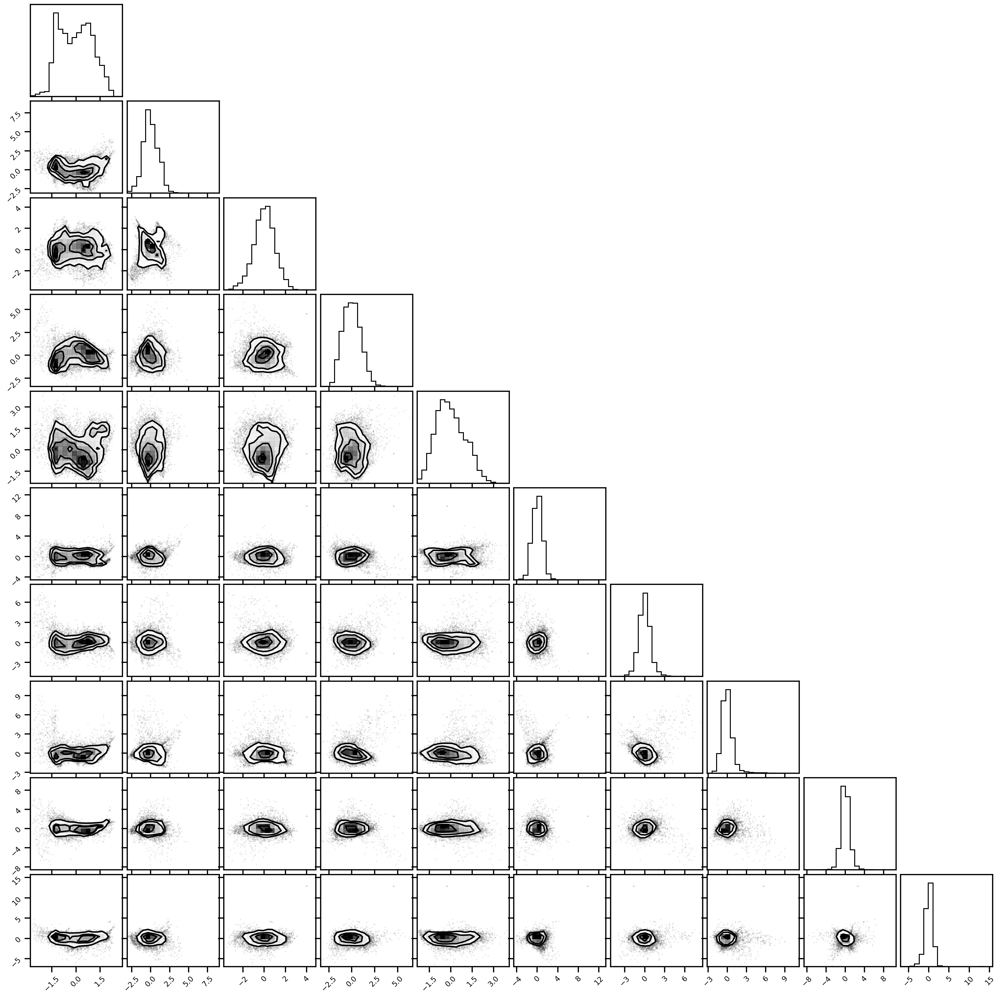

In [21]:
import corner

figure = corner.corner(radiances_pca[:, :10])

##### Transform Input Covariance

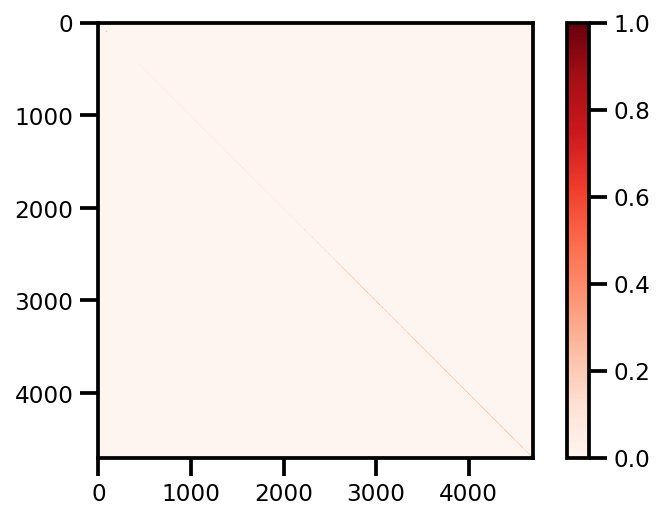

In [22]:
ig, ax = plt.subplots()

img = ax.imshow(input_cov, cmap="Reds", vmax=1.0)

plt.colorbar(img, )
plt.gcf()
wandb.log({f"input_cov": wandb.Image(plt)})
plt.show()

In [23]:
def transform_input_cov(cov, pca_scaler):
    
    cov = pca_scaler.components_ @ cov @ pca_scaler.components_.T
    
    if pca_scaler.whiten:
        cov /= np.sqrt(pca_scaler.explained_variance_)
    
    return cov

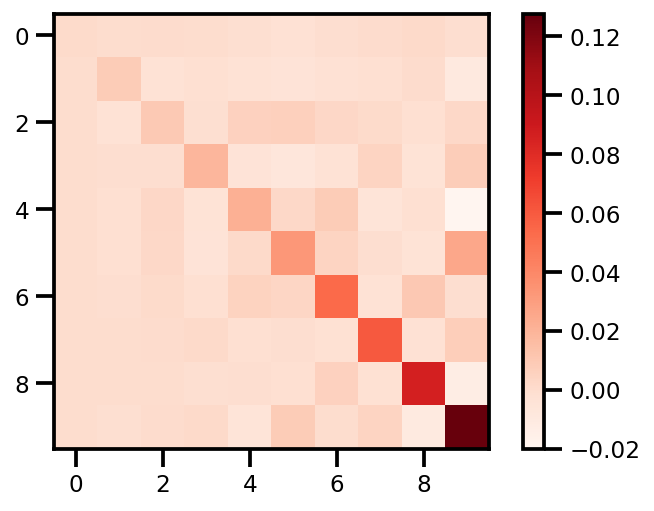

In [24]:
input_cov_scaled = transform_input_cov(jnp.sqrt(input_cov), pca_scaler)

# assert input_cov_scaled.shape[0] == n_components
# assert input_cov_scaled.shape[1] == n_components

fig, ax = plt.subplots()

img = ax.imshow(input_cov_scaled, cmap="Reds")

plt.colorbar(img)
plt.gcf()
wandb.log({f"input_cov_scaled": wandb.Image(plt)})
plt.show()

In [25]:
def rescale_x_data(Xtest):
    
    # inverse PCA transform
    Xtest = pca_scaler.transform(Xtest)
    
    
    return Xtest

def rescale_y_data(ytest):
    
    ytest = ytest[:, -1].reshape(-1, 1)
    
    return y_transformer.transform(ytest)

## Model

In [26]:
import chex
import jax
import jax.numpy as jnp
from chex import Array
from src.utils import identity_matrix, add_to_diagonal
from src.kernels import RBF

X_scaled = radiances_pca

n_features = X_scaled.shape[1]
n_length_scales = X_scaled.shape[1]

rbf_kernel = RBF(length_scale=jnp.ones(1), variance=1.0)

model = "sparse"
# wandb.config.model = model

In [27]:
# NUMPYRO SETTINGS
import numpyro
import numpyro.distributions as dist
from numpyro.infer.autoguide import AutoDiagonalNormal
from numpyro.infer import SVI, Trace_ELBO
from src.utils import init_inducing_subsample, init_inducing_kmeans
from src.sparse import init_default_sgp_model
from src.exact import init_default_gp_model

jitter = 1e-5
inference = "map"

n_inducing = 300

# wandb.config.jitter = jitter

# wandb.config.inference = inference
# wandb.config.n_inducing = n_inducing
# wandb.config.n_length_scales = n_length_scales

if model == "exact":

    numpyro_model = init_default_gp_model(
        n_features=n_length_scales, inference=inference, jitter=jitter
    )


elif model == "sparse":


    numpyro_model = init_default_sgp_model(
        X_scaled[:5_000],
        n_features=n_length_scales,
        inference=inference,
        n_inducing=n_inducing,
        jitter=jitter,
    )


else:
    raise ValueError(f"Unrecognized model: {model}")


def empty_guide(X, y):
    pass

In [28]:
# model_info, potential_fn, *_ = numpyro.infer.util.initialize_model(key, numpyro_model, model_args=(X_scaled[:100], y_scaled[:100]))

In [29]:
# NUMPYRO SETTINGS
with numpyro.handlers.seed(rng_seed=123):
    t = numpyro_model(X_scaled[:100], y_scaled[:100])

assert t.shape == y_scaled[:100].shape

#### Inference

In [30]:
from numpyro.infer.autoguide import (
    AutoDelta,
    AutoMultivariateNormal,
    AutoDiagonalNormal,
)

# ===================
# Model
# ===================
# GP model

# delta guide - basically deterministic


if inference == "map":
    guide = AutoDelta(numpyro_model)
elif inference == "vi_mf":
    guide = AutoDiagonalNormal(numpyro_model)
elif inference == "vi_full":
    guide = AutoMultivariateNormal(numpyro_model)
elif inference == "mll":

    def empty_guide(X, y):
        pass

    guide = empty_guide
else:
    raise ValueError(f"Unrecognized inference scheme: {inference}")

### Training

In [31]:
# reproducibility
rng_key = jax.random.PRNGKey(0)

# # Setup
# wandb.config.step_size = 0.01
# wandb.config.train_seed = 42
# wandb.config.iterations = 2_500


# Setup
optimizer = numpyro.optim.Adam(step_size=0.1)
# optimizer = numpyro.optim.Minimize()
# optimizer = optax.adamw(learning_rate=0.1)
svi = SVI(numpyro_model, guide, optimizer, loss=Trace_ELBO())
svi_results = svi.run(jax.random.PRNGKey(1), 1_000, X_scaled, y_scaled.T)

100%|██████████| 1000/1000 [04:07<00:00,  4.04it/s, init loss: 20725.7363, avg. loss [951-1000]: -1014.2924]


#### Loss

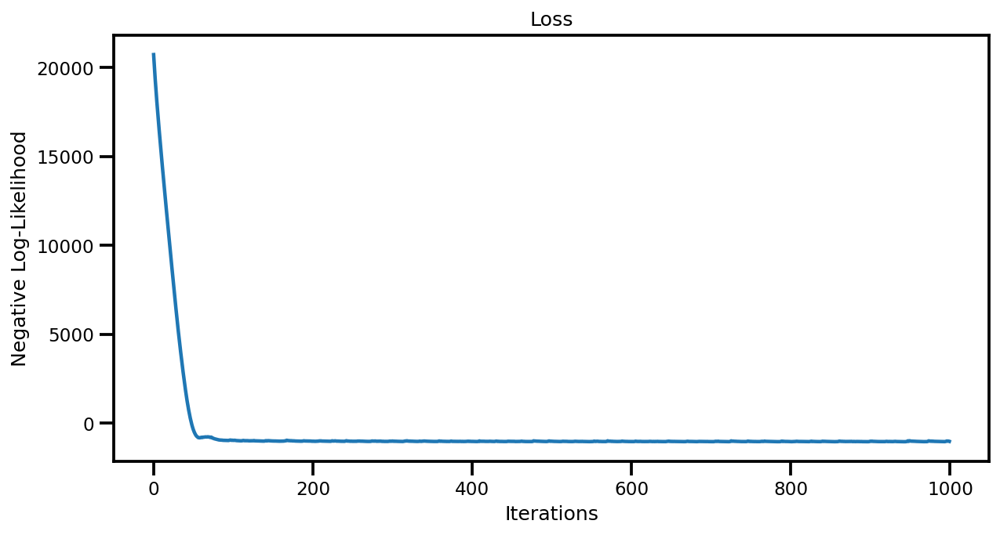

In [32]:
fig, ax = plt.subplots(figsize=(10, 5))

ax.plot(svi_results.losses)
ax.set(title="Loss", xlabel="Iterations", ylabel="Negative Log-Likelihood")
plt.gcf()
# wandb.log({"loss": wandb.Image(plt)})
plt.show()

In [33]:
from pprint import pprint

# Take them directly
learned_params = svi_results.params

if inference != "mll":
    if model == "sparse":
        x_u = learned_params["x_u"]
        learned_params = guide.median(learned_params)
        learned_params["x_u"] = x_u
    else:
        raise ValueError(f"Unrecognized model: {model}")
pprint(learned_params)

{'length_scale': DeviceArray([ 1.2764614,  2.1595833,  2.4727066,  4.6458516,  1.2399125,
              4.3141804,  6.1591544,  3.487235 , 12.785561 ,  5.9348617],            dtype=float32),
 'obs_noise': DeviceArray(0.03940251, dtype=float32),
 'variance': DeviceArray(0.4322504, dtype=float32),
 'x_u': DeviceArray([[-0.8761403 ,  0.334639  , -0.44769186, ..., -0.3396495 ,
               1.4023722 , -0.07844537],
             [-0.00868907, -0.01819316, -0.9680677 , ...,  0.3937259 ,
              -0.56424356, -3.0674477 ],
             [ 0.26320952, -0.79441476, -0.99029166, ..., -0.33097503,
               0.3370863 , -0.9201124 ],
             ...,
             [-1.2377547 ,  0.14254276,  0.52404815, ..., -0.65687984,
               0.7327106 , -0.27722633],
             [ 0.5449883 , -0.15223706,  0.4574322 , ...,  0.09861249,
              -0.7891802 ,  0.49333993],
             [-1.1576829 ,  0.91372174, -1.57632   , ..., -1.1326851 ,
               1.248431  , -0.07134033]], dtyp

## Predictions

In [34]:
if model == "sparse":
    from src.sparse import init_sgp_predictive

    gp_pred = init_sgp_predictive(RBF, learned_params, X_scaled, y_scaled, jitter=1e-5)
elif model == "exact":
    from src.exact import init_gp_predictive

    gp_pred = init_gp_predictive(RBF, learned_params, X_scaled, y_scaled, jitter=0.0)
else:
    raise ValueError(f"Unrecognized model: {model}")


mu = gp_pred.predict_mean(jnp.array(X_scaled))

#### Uncertain Predictions

In [35]:
from src.uncertain.monte_carlo import MCTransform
from sr

SyntaxError: invalid syntax (<ipython-input-35-d9ac4395956e>, line 2)

In [36]:
def init_egp_predictors(input_cov, gp_model, egp_model_name="mc", **kwargs):
    
    n_features = gp_model.kernel.length_scale.shape[0]
    
    if egp_model_name == "mc":
        from src.uncertain.monte_carlo import MCTransform
        
        
        key = jax.random.PRNGKey(kwargs.get("seed",123))
        
        egp_pred_mc = MCTransform(
            gp_model, 
            cov_type="diag", 
            **kwargs
        )
        
        pred_f = jax.partial(
            egp_pred_mc.predict_f, 
            key=key, 
            full_covariance=False,
            x_cov=jnp.array(np.sqrt(np.diag(input_cov)))
        )
        pred_f = jax.jit(pred_f)
    
    elif egp_model_name == "unc":
        from src.uncertain.unscented import UnscentedTransform
                
        egp_pred_mc = UnscentedTransform(
            gp_model, 
            n_features=n_features, 
            **kwargs
        )
        
        pred_f = jax.partial(
            egp_pred_mc.predict_f, 
            full_covariance=False,
            x_cov=jnp.array(np.diag(np.diag(input_cov)))
        )
        pred_f = jax.jit(pred_f)
    elif egp_model_name == "to1":
        from src.uncertain.taylor import TaylorO1Transform
                
        egp_pred = TaylorO1Transform(gp_model)
        
        pred_f = jax.partial(
            egp_pred.predict_f, 
            full_covariance=False,
            x_cov=jnp.array(input_cov)
        )
        pred_f = jax.jit(pred_f)
        
    elif egp_model_name == "to2":
        from src.uncertain.taylor import TaylorO2Transform
                
        egp_pred = TaylorO2Transform(gp_model)
        
        pred_f = jax.partial(
            egp_pred.predict_f, 
            full_covariance=False,
            x_cov=jnp.array(input_cov)
        )
        pred_f = jax.jit(pred_f)
    elif egp_model_name == "gh":
        from src.uncertain.quadrature import init_gausshermite_transform
        egp_pred = init_gausshermite_transform(
            gp_model, 
            n_features=n_features, 
            **kwargs
        )
        
        pred_f = jax.partial(
            egp_pred.predict_f, 
            full_covariance=False,
            x_cov=jnp.array(np.diag(np.diag(input_cov)))
        )
        pred_f = jax.jit(pred_f)
        
    else:
        raise ValueError(f"Unrecognized model: {egp_model_name}")
        
        
    return pred_f
        
        
def predict_in_batches(Xtest, pred_f, batch_size=5_000, error=True, transform=None):
    
    n_batches = max(int(Xtest.shape[0] / batch_size), 1)

    mus, stds = [], []
    with tqdm(np.array_split(Xtest, n_batches), leave=False) as pbar:
        for X_batch in pbar:
            
            if transform is not None:
                X_batch = transform(X_batch)
            if error:
                mu_, var_ = pred_f(x=X_batch)
            else:
                mu_, var_ = pred_f(X_batch)
            mus.append(mu_)
            stds.append(np.sqrt(var_))

    # concatenate
    mus = np.concatenate(mus, axis=0)
    stds = np.concatenate(stds, axis=0)
    
    return mus, stds    

In [37]:
egp_pred_f_mc = init_egp_predictors(input_cov_scaled, gp_pred, "mc", n_samples=100)
egp_pred_f_unc = init_egp_predictors(input_cov_scaled, gp_pred, "unc", )
egp_pred_f_to1 = init_egp_predictors(input_cov_scaled, gp_pred, "to1",)
egp_pred_f_to2 = init_egp_predictors(input_cov_scaled, gp_pred, "to2",)


In [38]:

mu, var = egp_pred_f_mc(x=jnp.array(X_scaled[:100]))
mu.min()

DeviceArray(-0.68403846, dtype=float32)

### Visualization

In [41]:
from src.utils import predict_in_batches
from src.plots import plot_all_uncertainty

#### Standard GP

  0%|          | 0/99 [00:00<?, ?it/s]

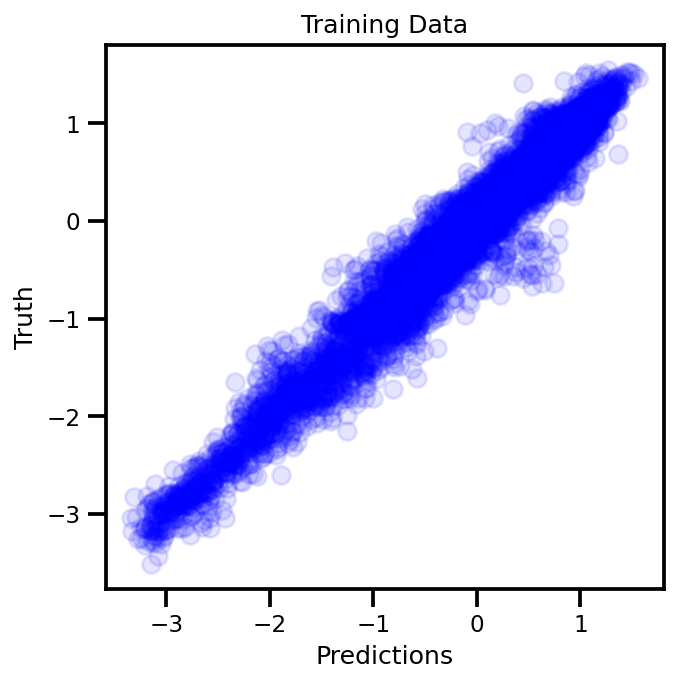

Lims is None. Setting lims now:
min_max_true: (-3.513445228178408, 1.5504420120619948)
min_max_pred: (-3.343474, 1.55882)
lims: (-3.513445228178408, 1.5588200092315674)
lims_ext: (-4.020671751919406, 2.066046532972565)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


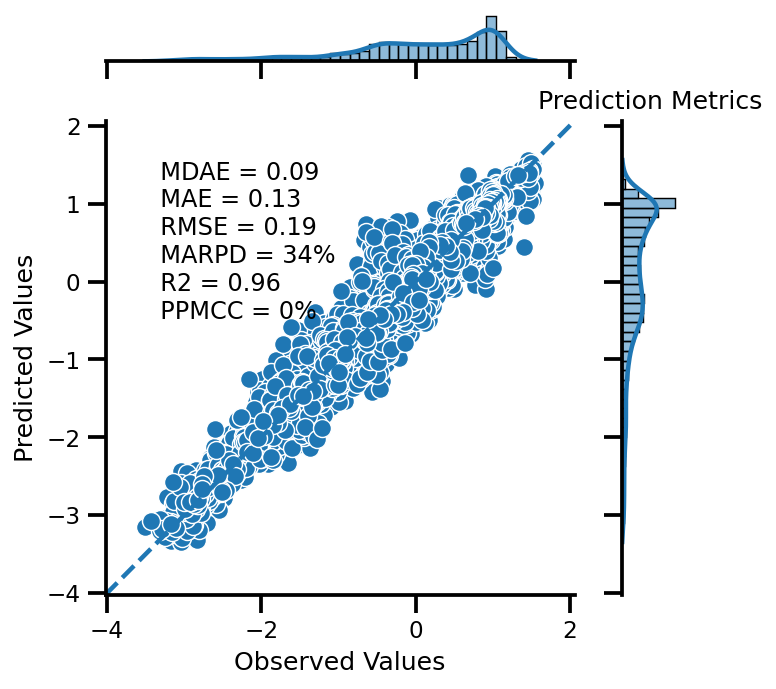

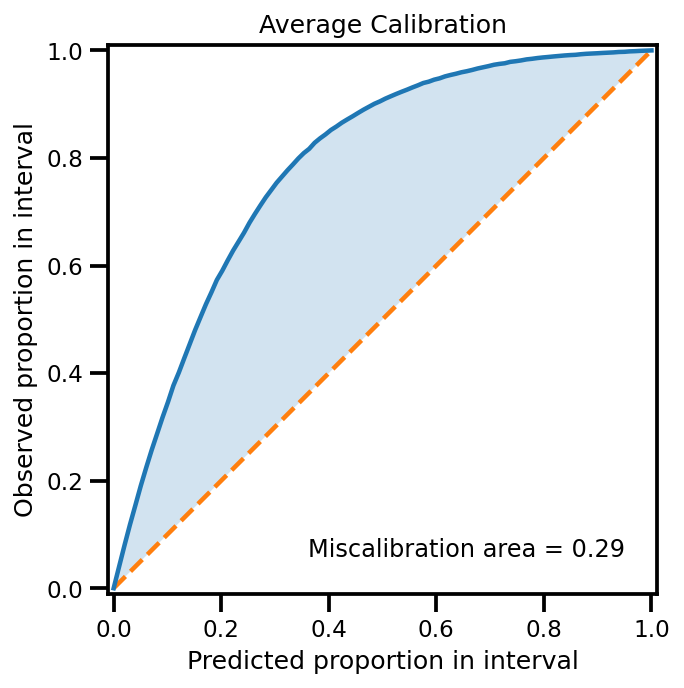

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


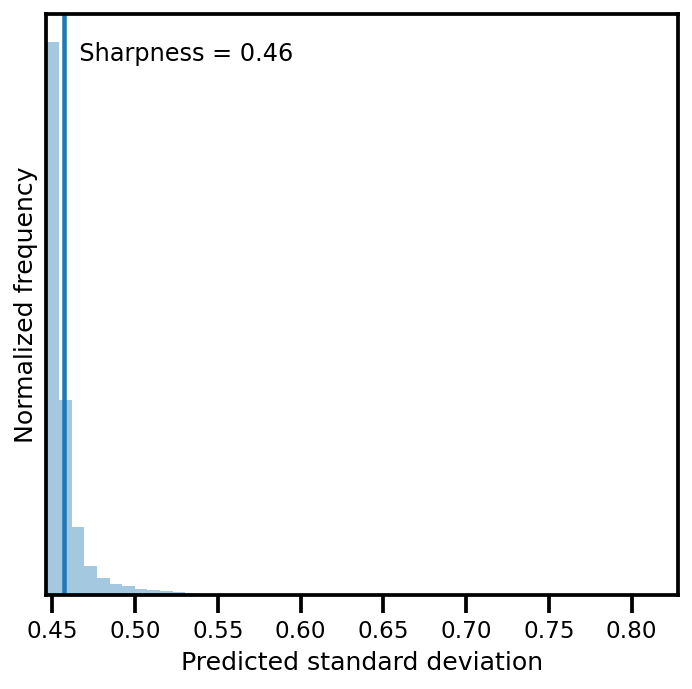

In [42]:
mu, var = predict_in_batches(X_scaled, gp_pred.predict_y, batch_size=100, error=False, notebook=True)

# mu, var = gp_pred.predict_y(jnp.array(X_scaled[:100]))

fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(mu, y_scaled, alpha=0.1, c="blue")
ax.set(xlabel="Predictions", ylabel="Truth", title="Training Data")

plt.show()


plot_all_uncertainty(y_pred=mu, y_var=var, y_true=y_scaled, model="standard", data="train")

#### MC Sampling

  0%|          | 0/99 [00:00<?, ?it/s]

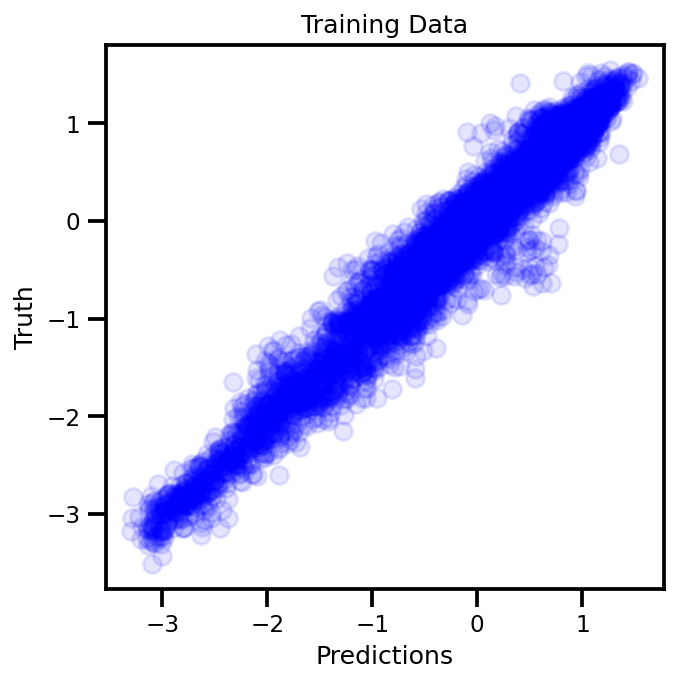

Lims is None. Setting lims now:
min_max_true: (-3.513445228178408, 1.5504420120619948)
min_max_pred: (-3.2986484, 1.53116)
lims: (-3.513445228178408, 1.5504420120619948)
lims_ext: (-4.019833952202449, 2.0568307360860354)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


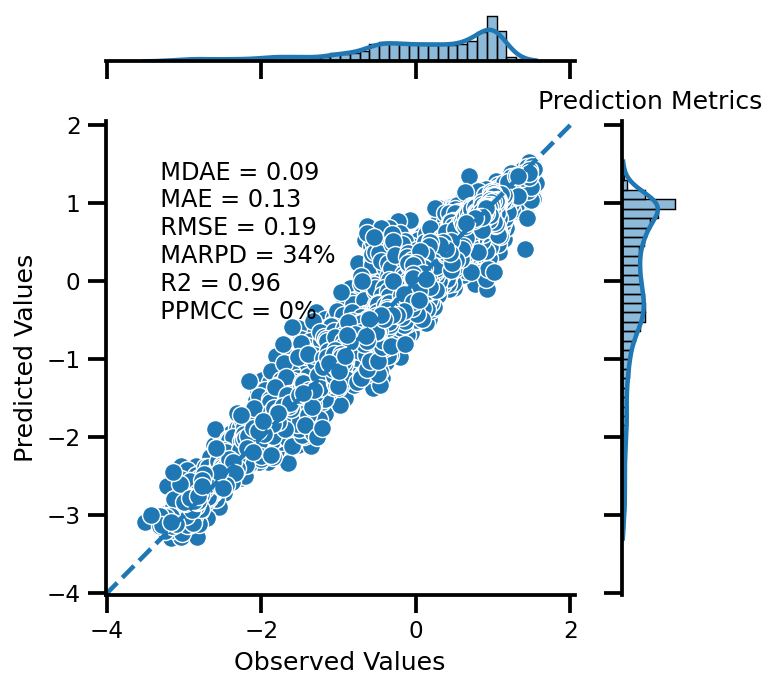

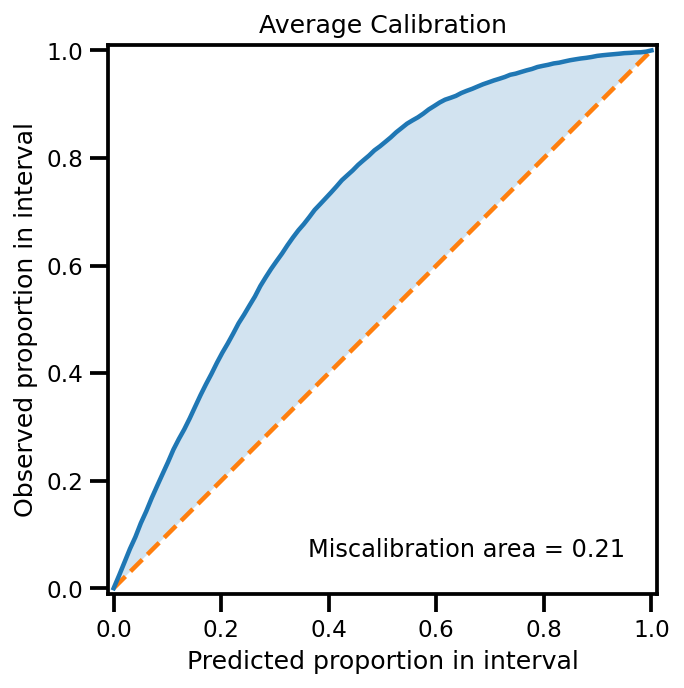

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


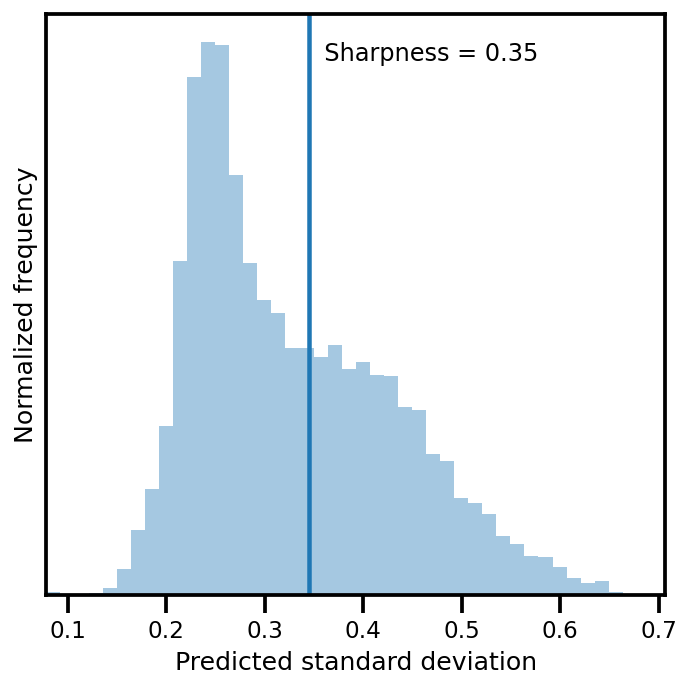

In [43]:
mu, var = predict_in_batches(X_scaled, egp_pred_f_mc, batch_size=100, error=True, notebook=True)


fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(mu, y_scaled, alpha=0.1, c="blue")
ax.set(xlabel="Predictions", ylabel="Truth", title="Training Data")

plt.show()


plot_all_uncertainty(y_pred=mu, y_var=var, y_true=y_scaled, model="mc", data="train")

#### Unscented Transform

  0%|          | 0/99 [00:00<?, ?it/s]

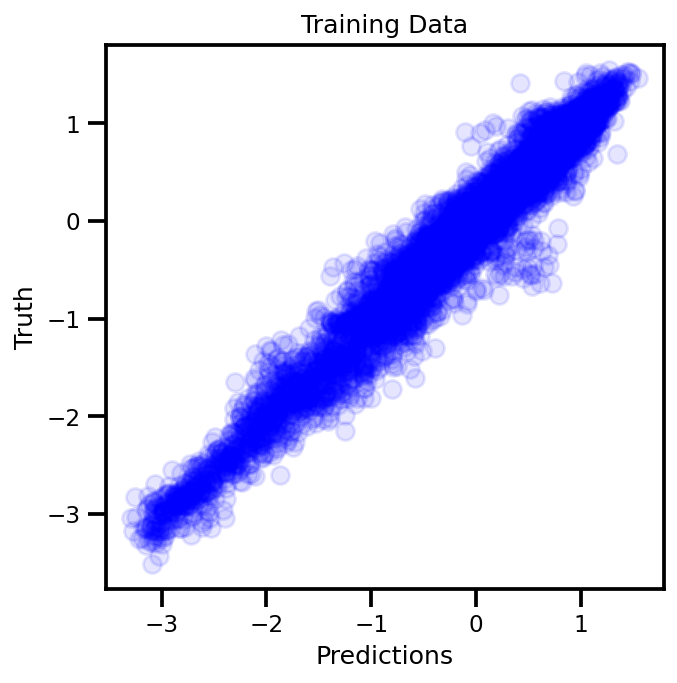

Lims is None. Setting lims now:
min_max_true: (-3.513445228178408, 1.5504420120619948)
min_max_pred: (-3.2918162, 1.5429592)
lims: (-3.513445228178408, 1.5504420120619948)
lims_ext: (-4.019833952202449, 2.0568307360860354)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


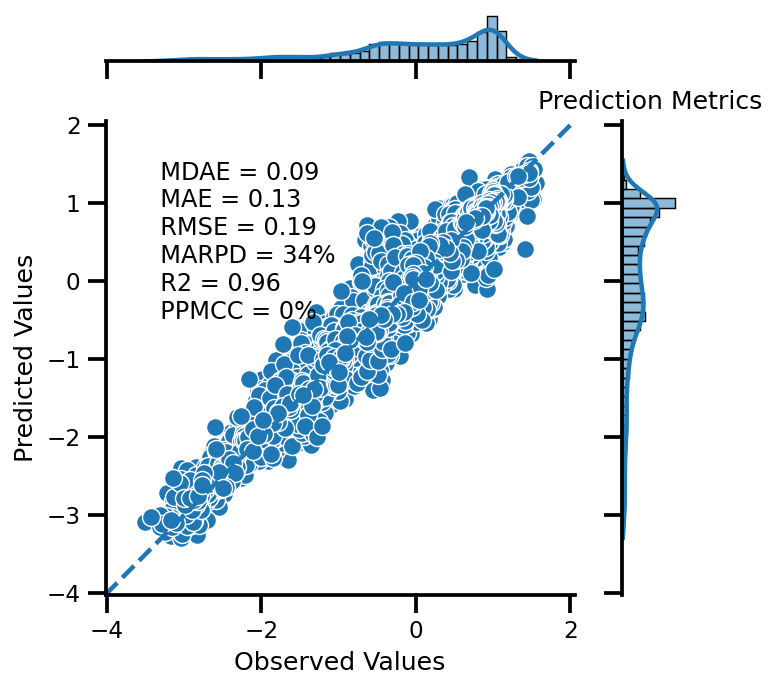

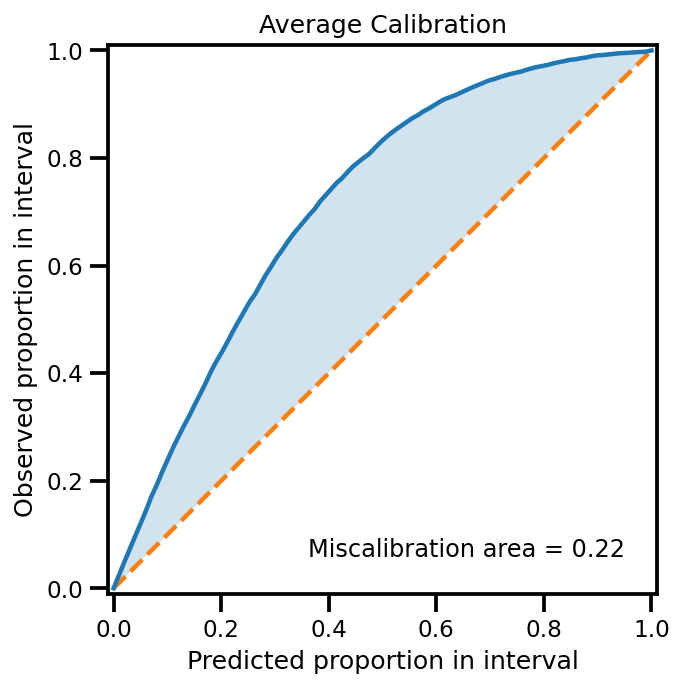

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


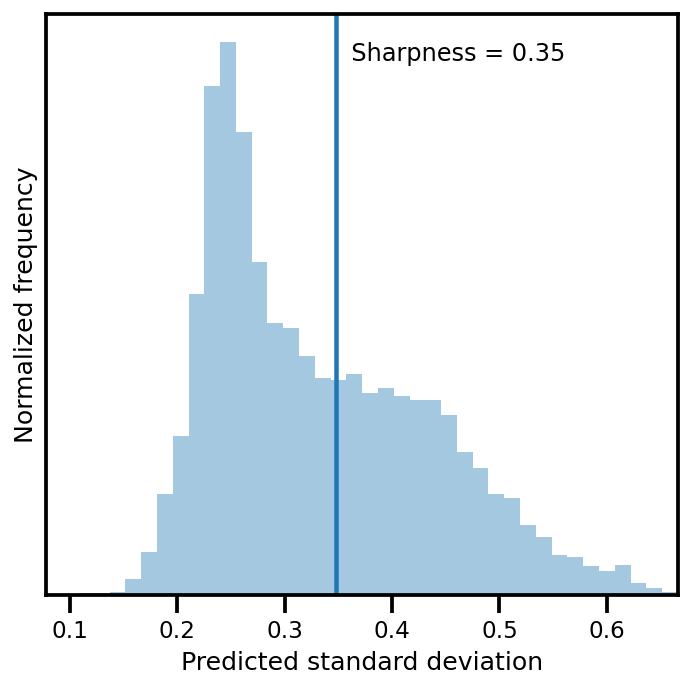

In [44]:
mu, var = predict_in_batches(X_scaled, egp_pred_f_unc, batch_size=100, error=True, notebook=True)

fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(mu, y_scaled, alpha=0.1, c="blue")
ax.set(xlabel="Predictions", ylabel="Truth", title="Training Data")

plt.show()


plot_all_uncertainty(y_pred=mu, y_var=var, y_true=y_scaled, model="unc", data="train")

#### Taylor Expansion (1st Order)

  0%|          | 0/99 [00:00<?, ?it/s]

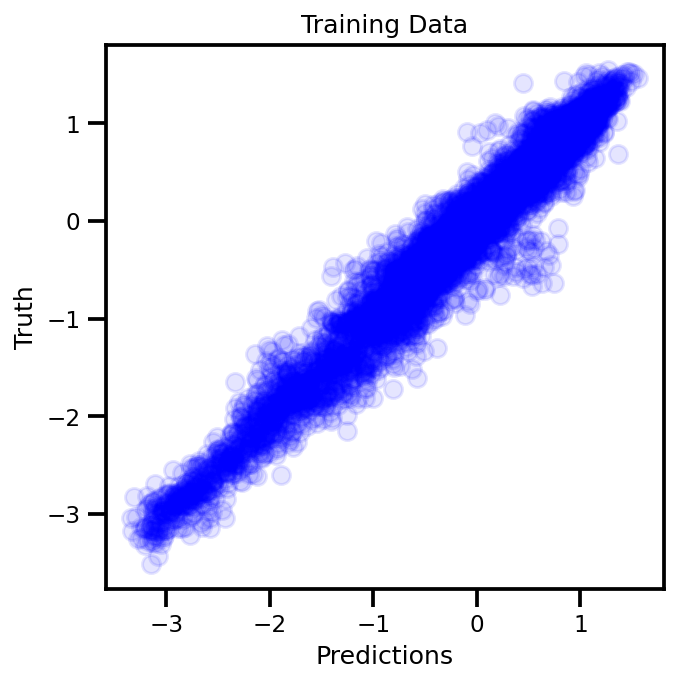

Lims is None. Setting lims now:
min_max_true: (-3.513445228178408, 1.5504420120619948)
min_max_pred: (-3.3434722, 1.5588082)
lims: (-3.513445228178408, 1.5588082075119019)
lims_ext: (-4.02067057174744, 2.066033551080933)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


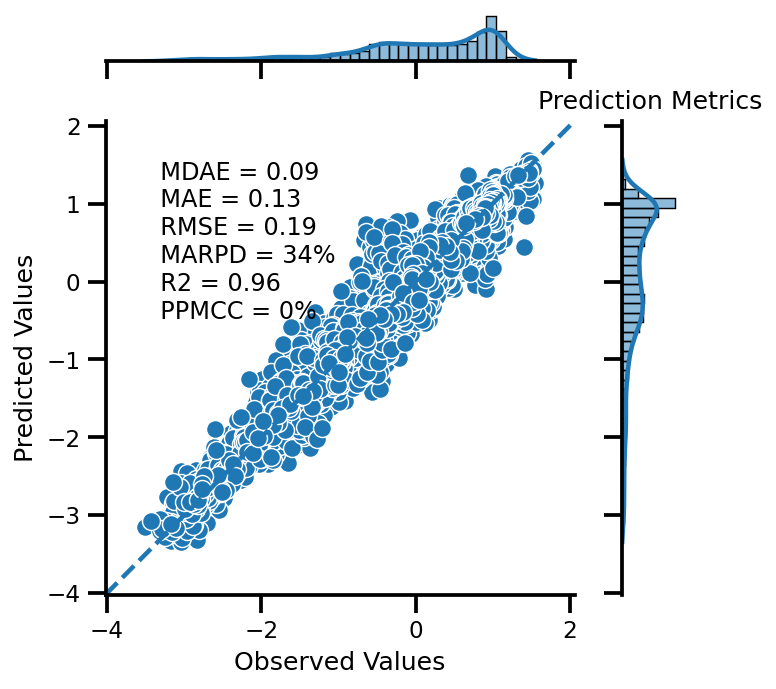

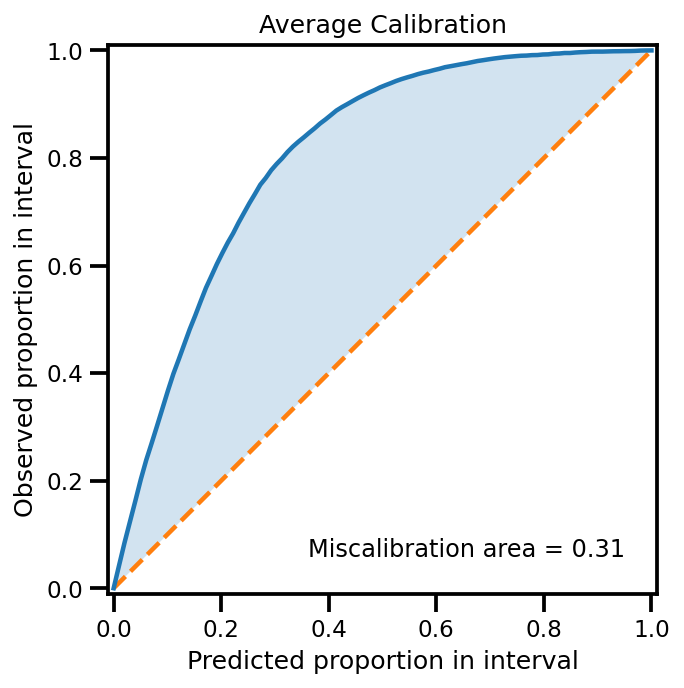

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


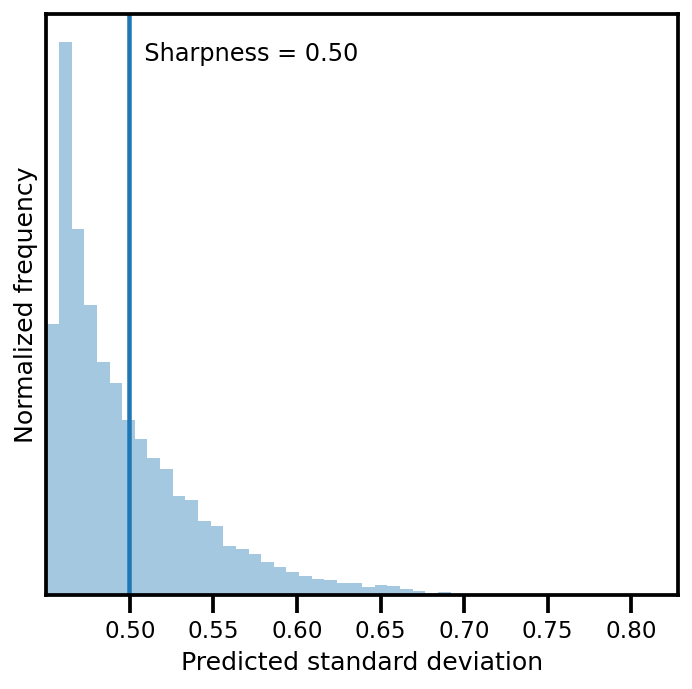

In [45]:
mu, var = predict_in_batches(X_scaled, egp_pred_f_to1, batch_size=100, error=True, notebook=True)

fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(mu, y_scaled, alpha=0.1, c="blue")
ax.set(xlabel="Predictions", ylabel="Truth", title="Training Data")

plt.show()


plot_all_uncertainty(y_pred=mu, y_var=var, y_true=y_scaled, model="to1", data="train")

#### Taylor Expansion (2nd Order)

  0%|          | 0/99 [00:00<?, ?it/s]

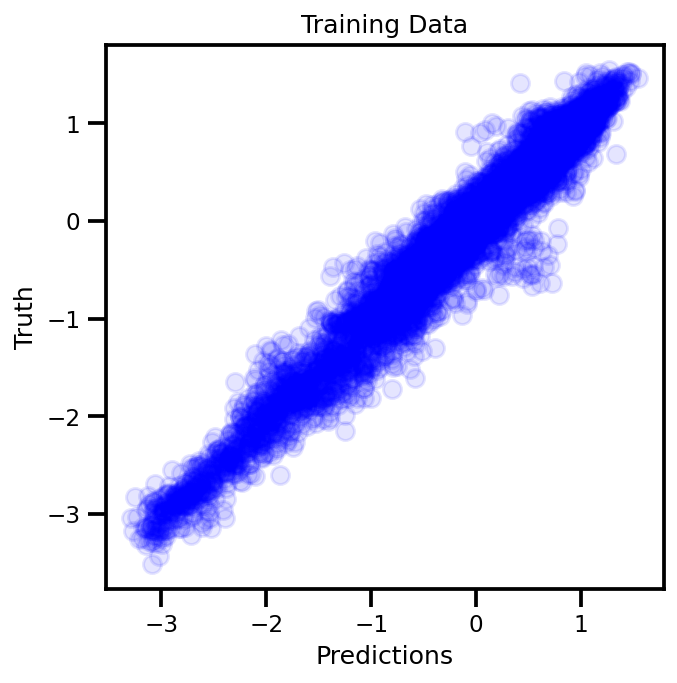

Lims is None. Setting lims now:
min_max_true: (-3.513445228178408, 1.5504420120619948)
min_max_pred: (-3.2908297, 1.5427144)
lims: (-3.513445228178408, 1.5504420120619948)
lims_ext: (-4.019833952202449, 2.0568307360860354)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


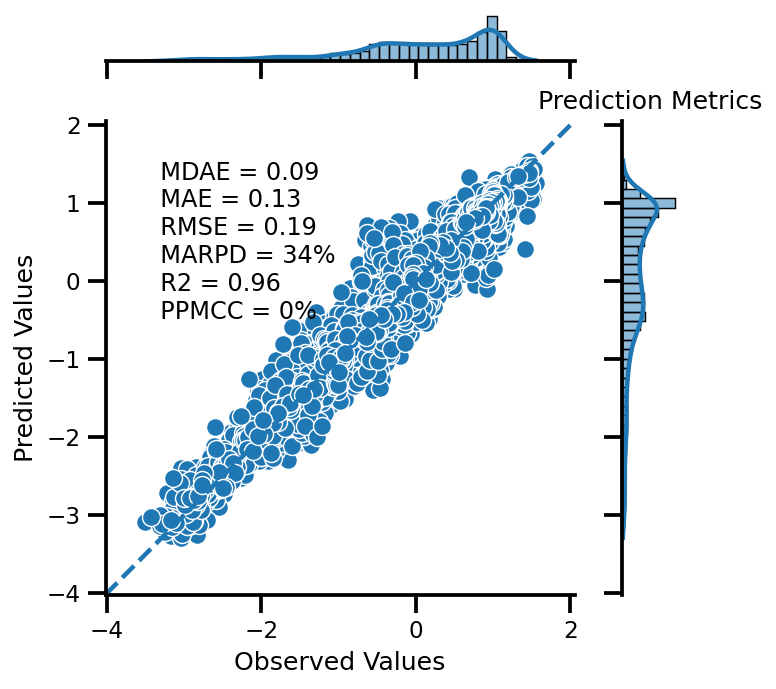

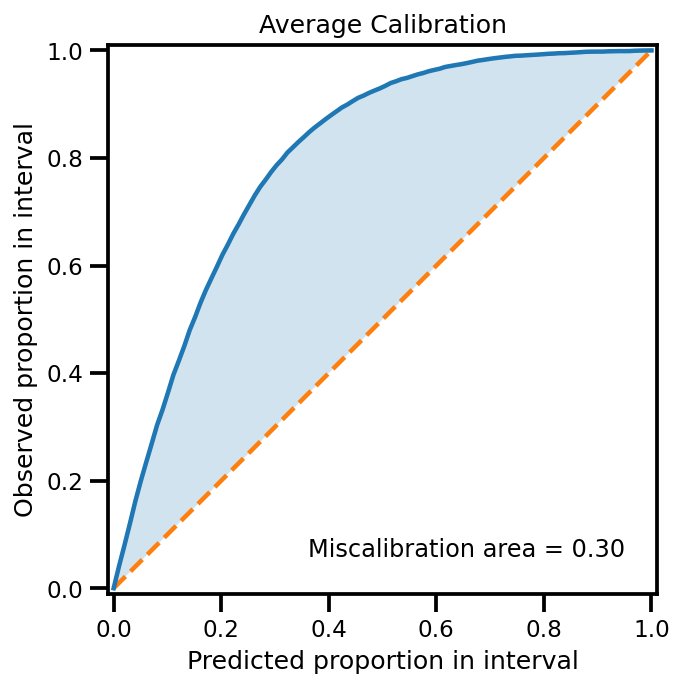

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


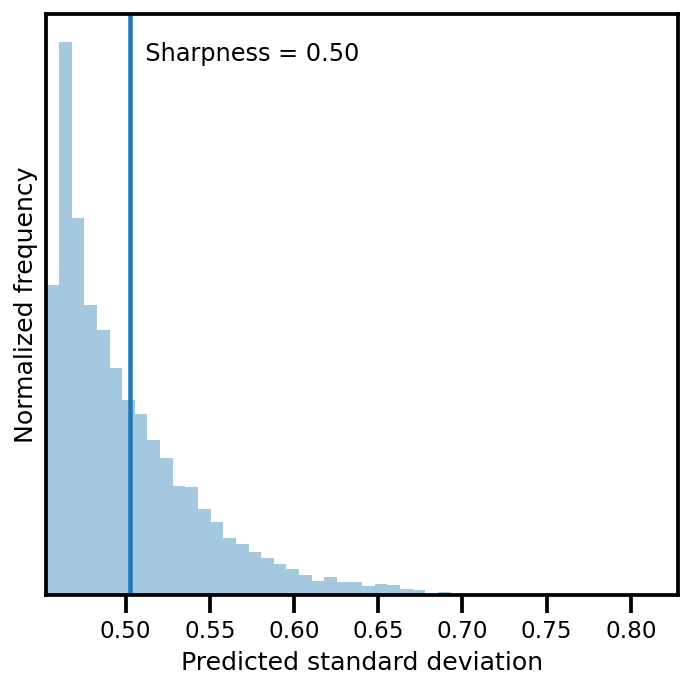

In [46]:
egp_pred_f_to2 = init_egp_predictors(input_cov_scaled, gp_pred, "to2",)

mu, var = predict_in_batches(X_scaled, egp_pred_f_to2, batch_size=100, error=True, notebook=True)


fig, ax = plt.subplots(figsize=(5, 5))
ax.scatter(mu, y_scaled, alpha=0.1, c="blue")
ax.set(xlabel="Predictions", ylabel="Truth", title="Training Data")

plt.show()


plot_all_uncertainty(y_pred=mu, y_var=var, y_true=y_scaled, model="to2", data="train")

In [47]:
def rescale_x_data(Xtest):
    
    
    # inverse PCA transform
    Xtest = pca_scaler.transform(Xtest)
    
    
    return Xtest

def rescale_y_data(ytest):
    
    ytest = ytest[:, -1].reshape(-1, 1)
    
    return y_transformer.transform(ytest)

def select_toa(y):
    
    y = y[:, -1].reshape(-1, 1)
    return y

In [48]:
def create_result_df(true, mus, stds, lats, lons, model):
    
    true = true.squeeze()
    mus = mus.squeeze()
    stds = stds.squeeze()
    lats = lats.squeeze()
    lons = lons.squeeze()
    n_points = lon.shape[0]
    # create dataframe
    df = pd.DataFrame({"latitude": lats, "longitude": lons, "true": true, "mus": mus, "stds": stds, "model": n_points * [model]})

    # set index
    df = df.set_index(["latitude", "longitude", "model"])
    
    return df

## Test Data

In [49]:
from tqdm.notebook import tqdm
from src.utils import rescale_data

In [51]:
%%time
import numpy as np

radiances_test = []
temperatures_test = []
temperatures_mu = []
temperatures_std = []
latitudes_test = []
longitudes_test = []

results_df = pd.DataFrame()

with tqdm(list(zip(orbits.values, seeds))) as pbar:
    for iorbit, iseed in pbar:
        pbar.set_description(f"Orbit: {iorbit[0]} | Loading Radiances...")
        Xtest = load_radiances(orbit=iorbit[0], subsample=None, clean=True, random_state=None)
        
        Xtest = rescale_data(Xtest, pca_scaler.transform)
        
        pbar.set_description(f"Orbit: {iorbit[0]} | Loading Temperatures...")
        labels = load_labels(orbit=iorbit[0], label="T", subsample=None, random_state=None)
        
        labels = rescale_data(labels, select_toa)
        labels = rescale_data(labels, y_transformer.transform)

        
        pbar.set_description(f"Orbit: {iorbit[0]} | Loading Coordinates...")
        lon, lat  = load_coordinates(orbit=iorbit[0], subsample=None, random_state=None)
        
        # Predictions (Standard)
        pbar.set_description(f"Orbit: {iorbit[0]} | Predicting (Standard GP)...")
        mus, stds = predict_in_batches(Xtest, gp_pred.predict_y, batch_size=5_000, error=False, transform=None, notebook=True)
        
        df = create_result_df(
            labels, 
            mus, 
            stds,
            lat,
            lon,
            "standard"

        )
        
        results_df = results_df.append(df)
        

        # Predictions (Unscented)
        pbar.set_description(f"Orbit: {iorbit[0]} | Predicting (Unscented GP)...")
        mus, stds = predict_in_batches(Xtest, egp_pred_f_unc, batch_size=1_000, error=True, transform=None, notebook=True)
        
        df = create_result_df(
            labels, 
            mus, 
            stds,
            lat,
            lon,
            "unc"

        )
        
        
        results_df = results_df.append(df)
        
        # Predictions (Taylor, O1)
        pbar.set_description(f"Orbit: {iorbit[0]} | Predicting (Taylor GP, o1)...")
        mus, stds = predict_in_batches(Xtest, egp_pred_f_to1, batch_size=1_000, error=True, transform=None, notebook=True)
        
        df = create_result_df(
            labels, 
            mus, 
            stds,
            lat,
            lon,
            "taylor1"

        )
        
        results_df = results_df.append(df)
        
        # Predictions (Taylor, O2)
        pbar.set_description(f"Orbit: {iorbit[0]} | Predicting (Taylor GP, o2)...")
        mus, stds = predict_in_batches(Xtest, egp_pred_f_to2, batch_size=1_000, error=True, transform=None, notebook=True)
        
        df = create_result_df(
            labels, 
            mus, 
            stds,
            lat,
            lon,
            "taylor2"

        )
        
        results_df = results_df.append(df)
        
        # Predictions (MC)
        pbar.set_description(f"Orbit: {iorbit[0]} | Predicting (MC GP)...")
        mus, stds = predict_in_batches(Xtest, egp_pred_f_mc, batch_size=100, error=True, transform=None, notebook=True)
        
        df = create_result_df(
            labels, 
            mus, 
            stds,
            lat,
            lon,
            "mc"

        )
        
        results_df = results_df.append(df)

results_df = results_df.groupby(level=results_df.index.names).mean()

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/891 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/890 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/891 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/17 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/89 [00:00<?, ?it/s]

  0%|          | 0/890 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

  0%|          | 0/18 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/91 [00:00<?, ?it/s]

  0%|          | 0/918 [00:00<?, ?it/s]

CPU times: user 5h 53min 20s, sys: 14h 6min 23s, total: 19h 59min 43s
Wall time: 53min 8s


In [52]:
y_transformer.mean_, y_transformer.scale_

(array([281.01824408]), array([17.93046473]))

In [53]:

results_df = results_df.groupby(level=results_df.index.names).mean()

In [54]:
results_xr = results_df.to_xarray()
results_xr

<xarray.Dataset>
Dimensions:    (latitude: 359, longitude: 720, model: 5)
Coordinates:
  * latitude   (latitude) float64 -89.5 -89.0 -88.5 -88.0 ... 88.5 89.0 89.5
  * longitude  (longitude) float64 -179.5 -179.0 -178.5 ... 179.0 179.5 180.0
  * model      (model) object 'mc' 'standard' 'taylor1' 'taylor2' 'unc'
Data variables:
    true       (latitude, longitude, model) float64 nan nan nan ... nan nan nan
    mus        (latitude, longitude, model) float32 nan nan nan ... nan nan nan
    stds       (latitude, longitude, model) float32 nan nan nan ... nan nan nan

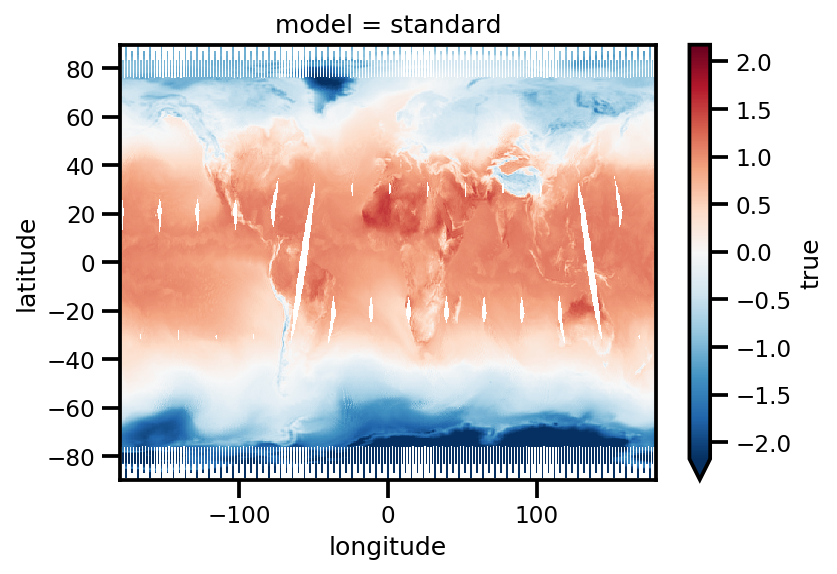

In [55]:
fig, ax = plt.subplots()
results_xr.true.sel(model="standard").plot(cmap="RdBu_r", robust=True)
plt.show()

In [56]:
results_xr.sel(model="standard").mus.values = y_transformer.inverse_transform(results_xr.sel(model="standard").mus.values)

In [57]:
results_xr.mus.sel(model="standard").values

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)

In [58]:
import cartopy.crs as ccrs

def plot_mean_maps(data):
    transform = ccrs.Robinson()
    
    fig = plt.figure(figsize=(7, 5))
    ax = fig.add_subplot(111, projection=transform)
    
    data.plot.pcolormesh(
        ax=ax, cmap="RdBu_r", robust=True, label=None ,
        transform=ccrs.PlateCarree(),
        cbar_kwargs={'orientation': 'horizontal',
                                       'pad': 0.05, 'label': ''}
    )
    ax.set(title="")
    ax.coastlines()
    return fig, ax

In [59]:
def rescale_xr_labels(data, scaler):
    data = scaler.scale_ * data + scaler.mean_
    data = data - 273.15
    return data

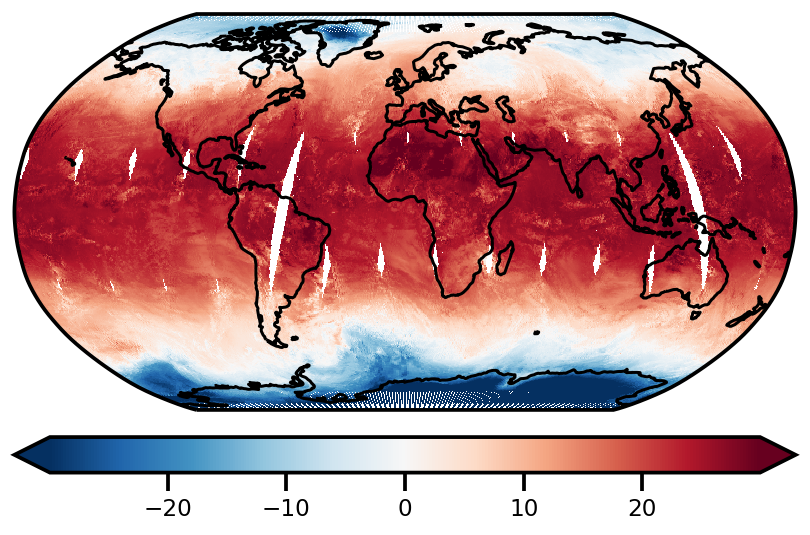

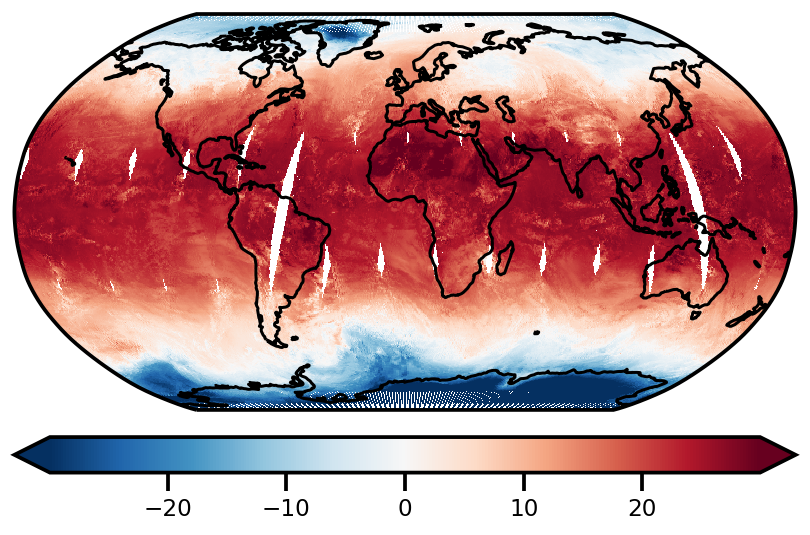

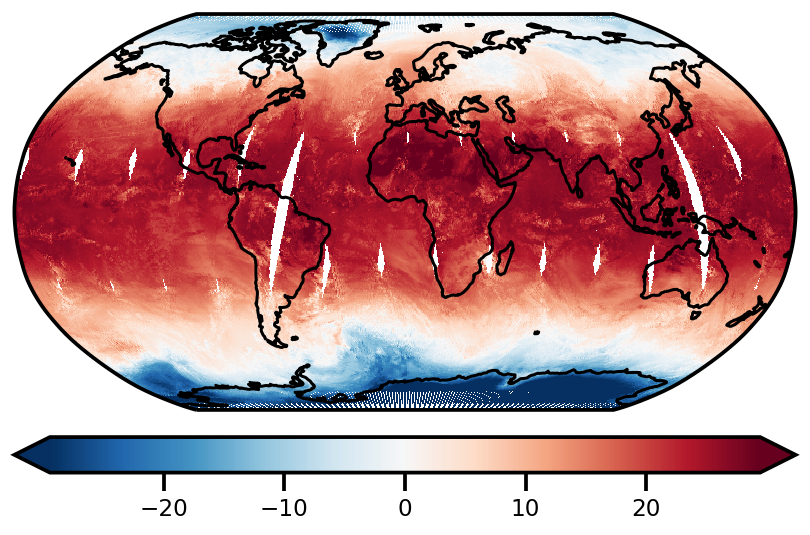

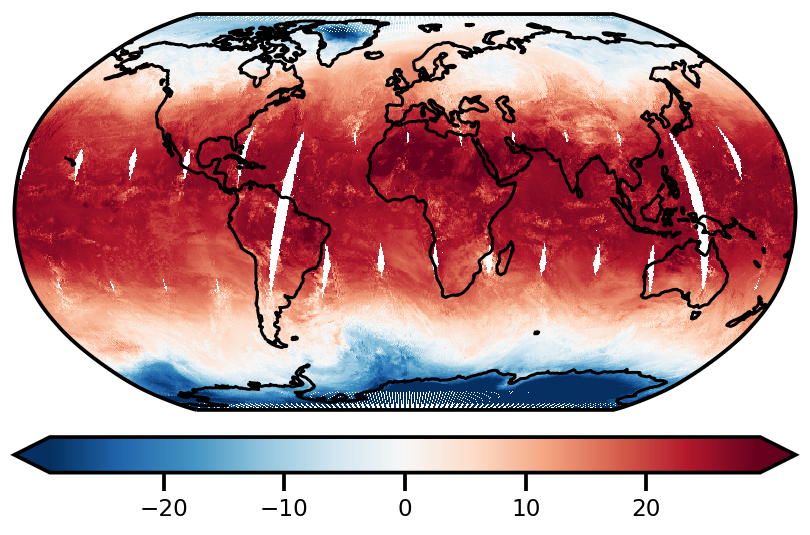

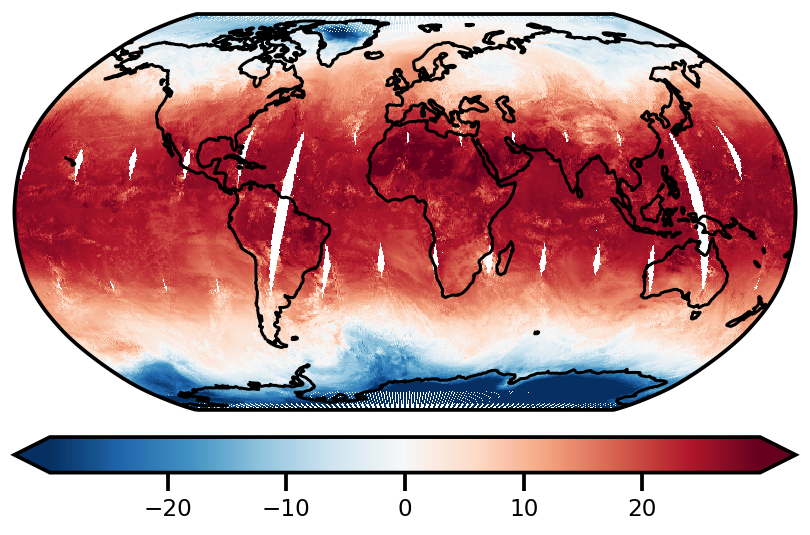

In [60]:
dat = results_xr.mus.sel(model="standard")
dat = rescale_xr_labels(dat, y_transformer)
fig, ax = plot_mean_maps(dat)
plt.gcf()
wandb.log({f"maps_mu_true": wandb.Image(plt)})



for imodel in ["standard", "mc", "unc", "taylor1"]:

    # STANDARD
    dat = results_xr.mus.sel(model=imodel)
    dat = rescale_xr_labels(dat, y_transformer)
    fig, ax = plot_mean_maps(dat)
    plt.gcf()
    wandb.log({f"maps_mu_{imodel}": wandb.Image(plt)})

### MAE Maps

In [61]:
import cartopy.crs as ccrs

def plot_error_maps(data, **kwargs):
    transform = ccrs.Robinson()
    
    fig = plt.figure(figsize=(7, 5))
    ax = fig.add_subplot(111, projection=transform)
    
    data.plot.pcolormesh(
        ax=ax, cmap="Reds", robust=True, label=None, 
        transform=ccrs.PlateCarree(),
        cbar_kwargs={'orientation': 'horizontal',
                                       'pad': 0.05, 'label': ''},
        **kwargs
    )
    ax.set(title="")
    ax.coastlines()
    return fig, ax

In [62]:
def calculate_error(pred, true):
    return np.abs(pred - true)

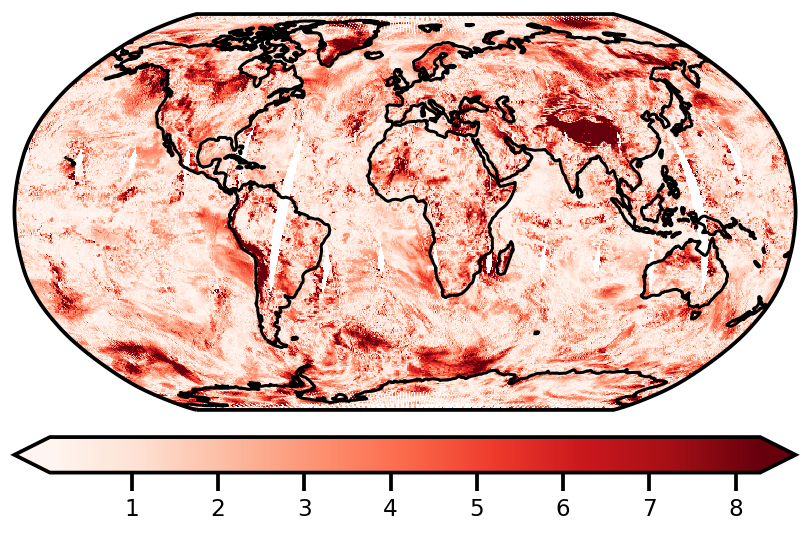

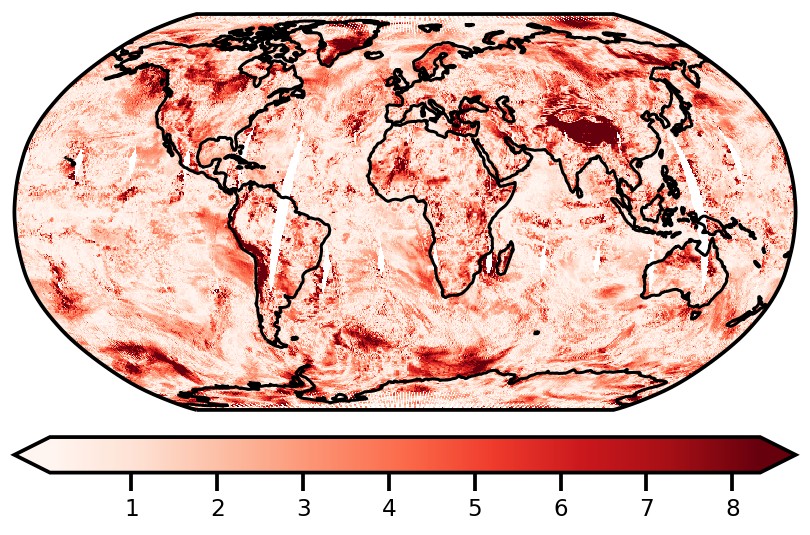

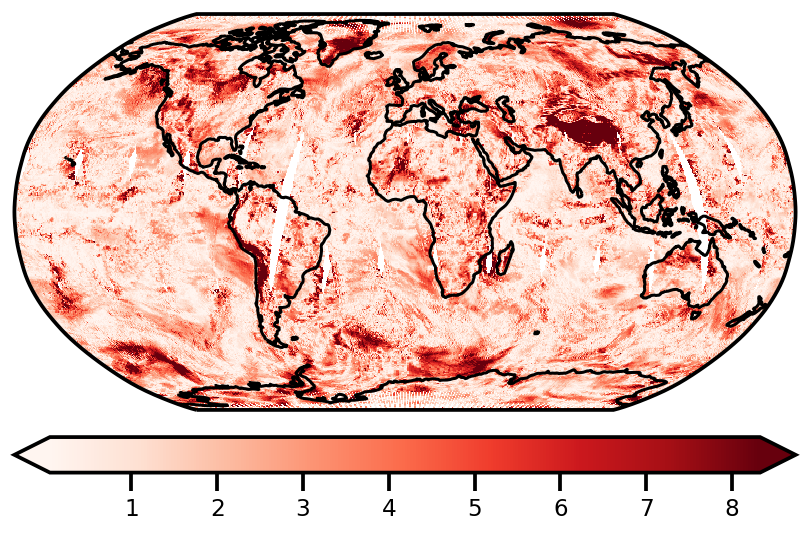

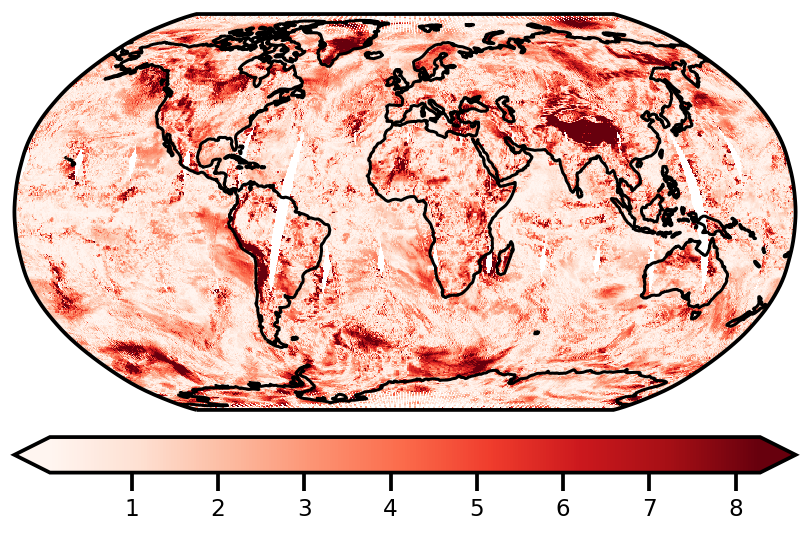

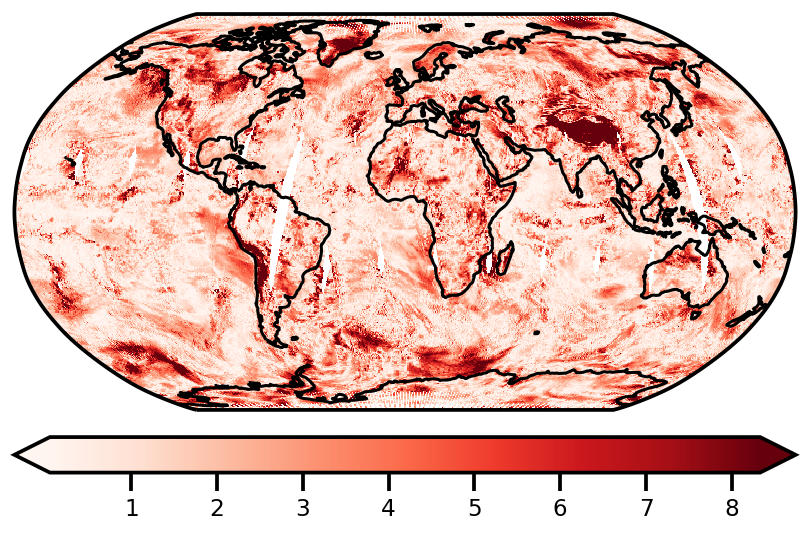

In [63]:
# TRUE
xr_true = results_xr.true.sel(model="standard")
xr_true = rescale_xr_labels(xr_true, y_transformer)

for imodel in ["standard", "mc", "unc", "taylor1", "taylor2"]:

    # STANDARD
    xr_pred = results_xr.mus.sel(model=imodel)
    xr_pred = rescale_xr_labels(xr_pred, y_transformer)
    xr_abs_err = calculate_error(xr_pred,xr_true)
    fig, ax = plot_error_maps(xr_abs_err)
    plt.gcf()
    wandb.log({f"maps_mae_{imodel}": wandb.Image(plt)})


### Standard Deviation

In [64]:
def rescale_xr_labels_std(data, scaler):
    data = scaler.scale_ * data 
    return data

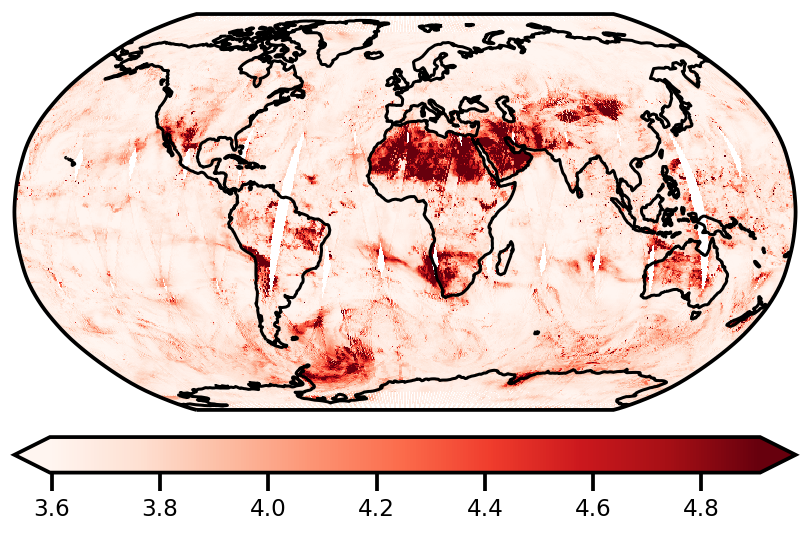

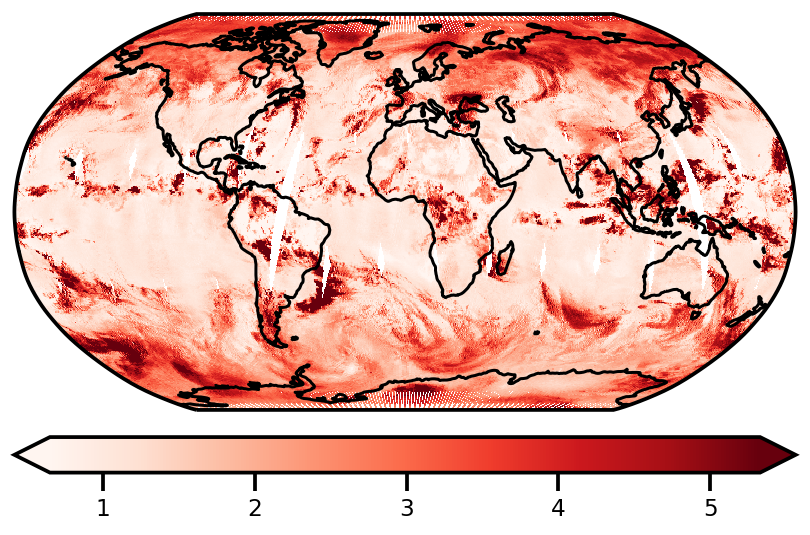

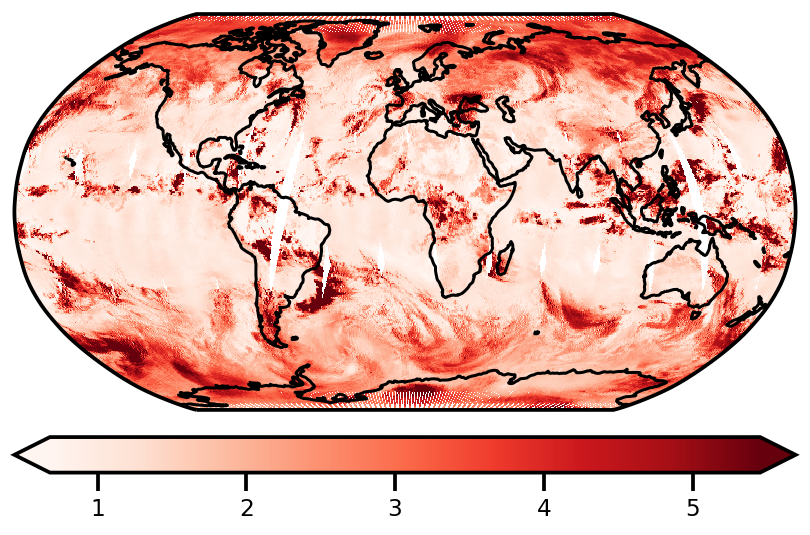

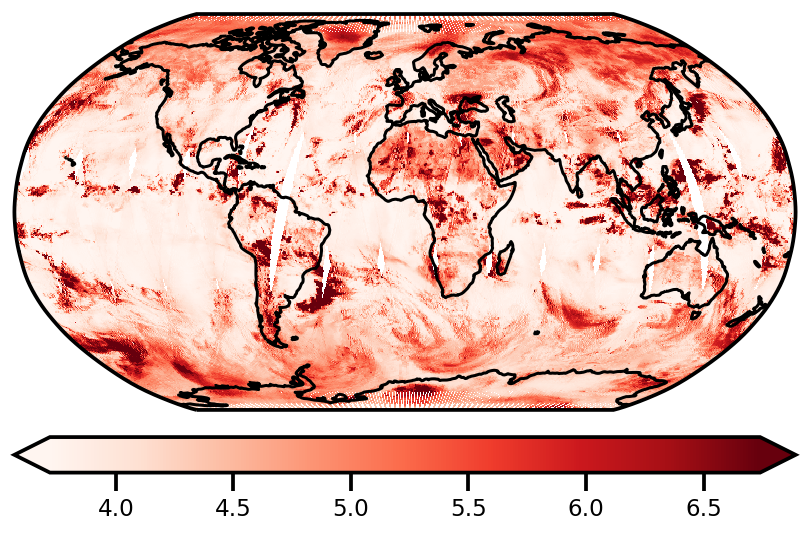

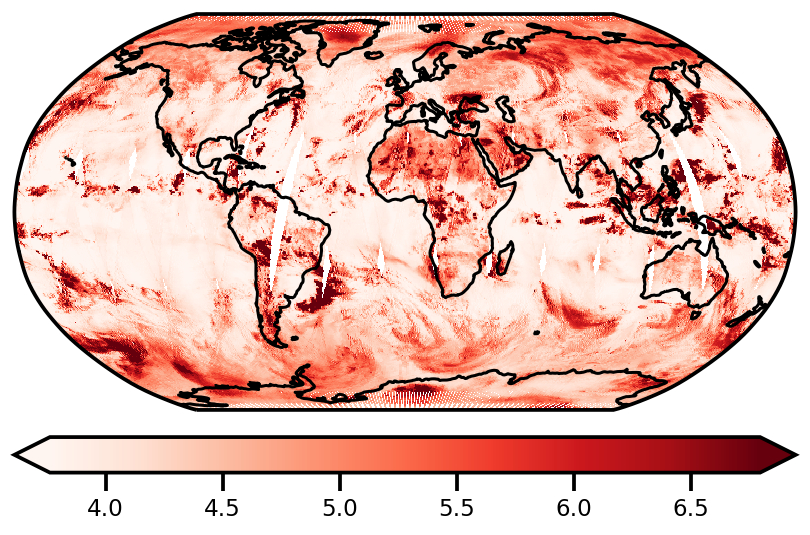

In [65]:
for imodel in ["standard", "mc", "unc", "taylor1", "taylor2"]:

    # STANDARD
    xr_pred = results_xr.stds.sel(model=imodel)
    xr_pred = rescale_xr_labels_std(xr_pred, y_transformer)
    fig, ax = plot_error_maps(xr_pred)
    plt.gcf()
    wandb.log({f"maps_stds_{imodel}": wandb.Image(plt)})

### Calibration

In [66]:
results_df.loc[:, :, "standard"].head()

true       mus      stds
latitude longitude                              
-89.5    -168.0    -3.165005 -3.176624  0.208132
         -152.0    -3.144823 -3.156960  0.206091
         -136.0    -3.153855 -3.117788  0.206926
         -120.0    -3.125770 -3.146023  0.206359
         -104.0    -3.104127 -3.187489  0.206533

Lims is None. Setting lims now:
min_max_true: (-3.527917015966839, 1.5959772113671293)
min_max_pred: (-3.228819, 1.6727796)
lims: (-3.527917015966839, 1.6727795600891113)
lims_ext: (-4.047986673572434, 2.1928492176947065)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


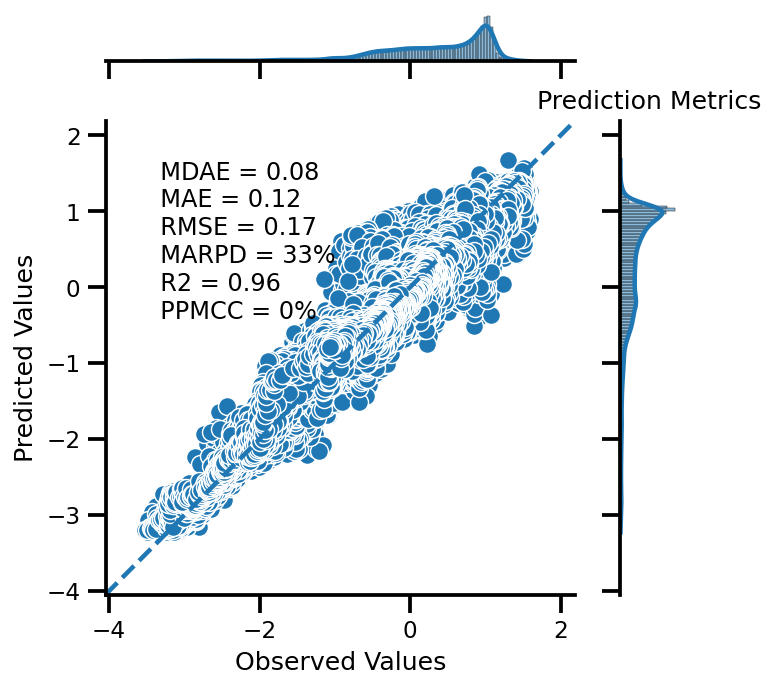

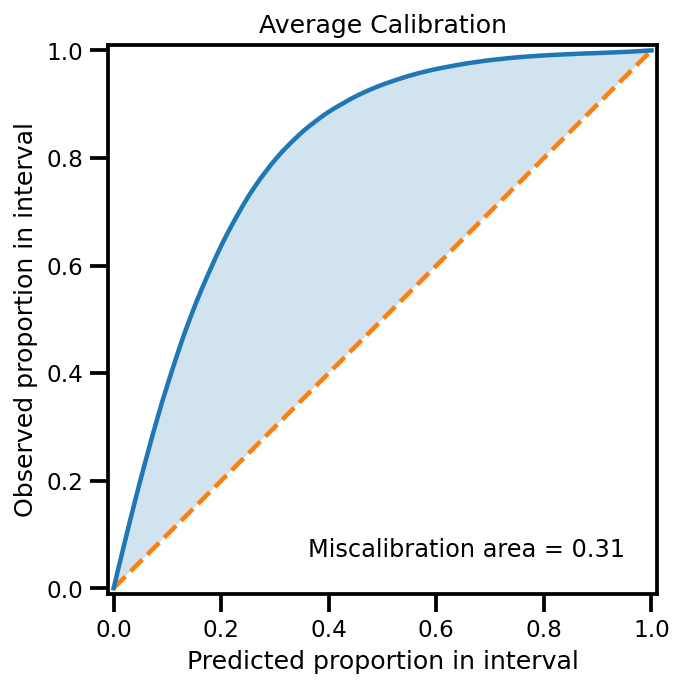

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


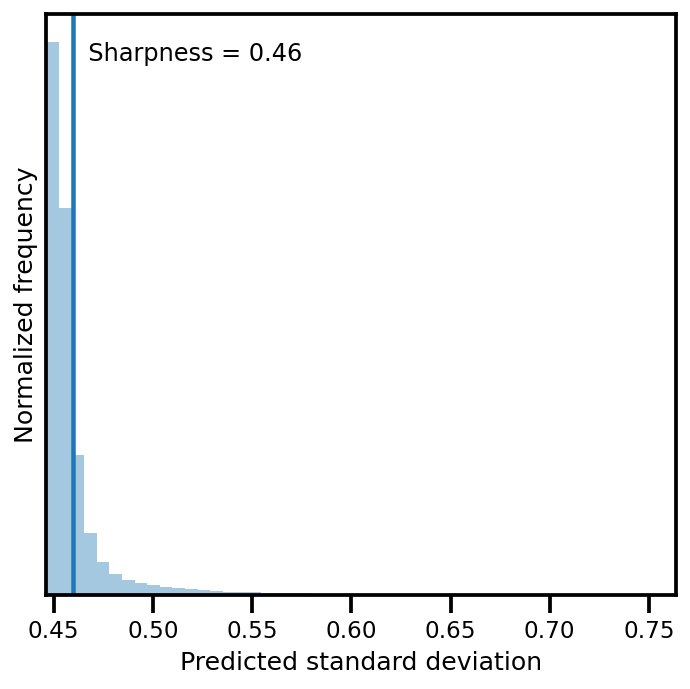

Lims is None. Setting lims now:
min_max_true: (-3.527917015966839, 1.5959772113671293)
min_max_pred: (-3.1827378, 1.661654)
lims: (-3.527917015966839, 1.661653995513916)
lims_ext: (-4.046874117114914, 2.1806110966619916)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


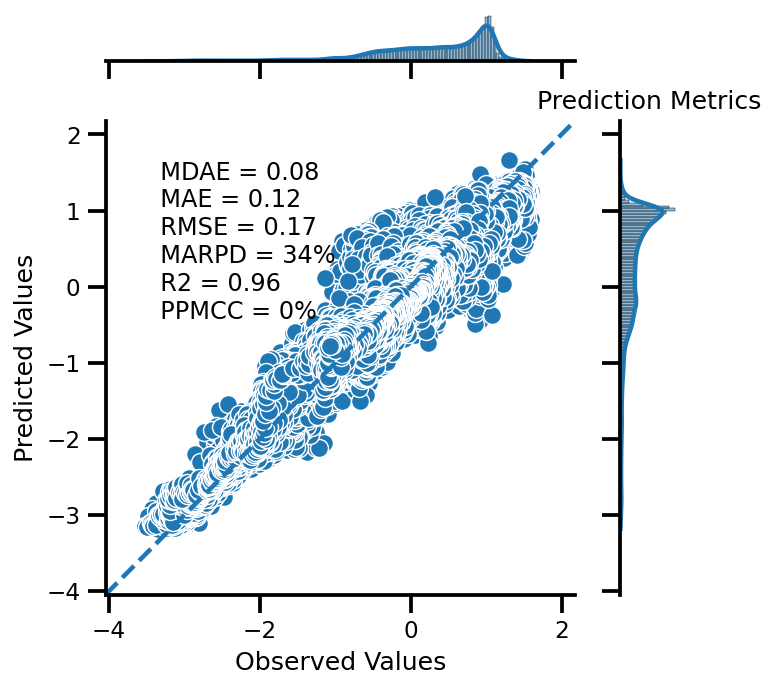

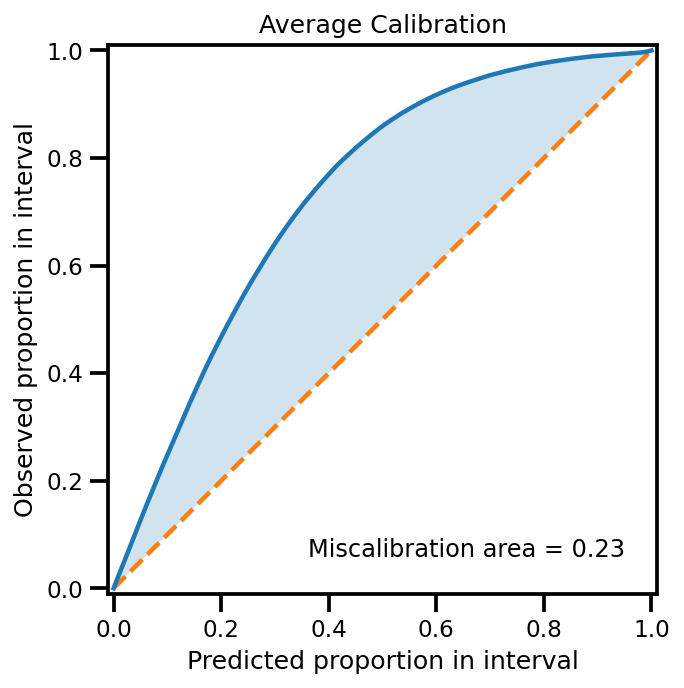

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


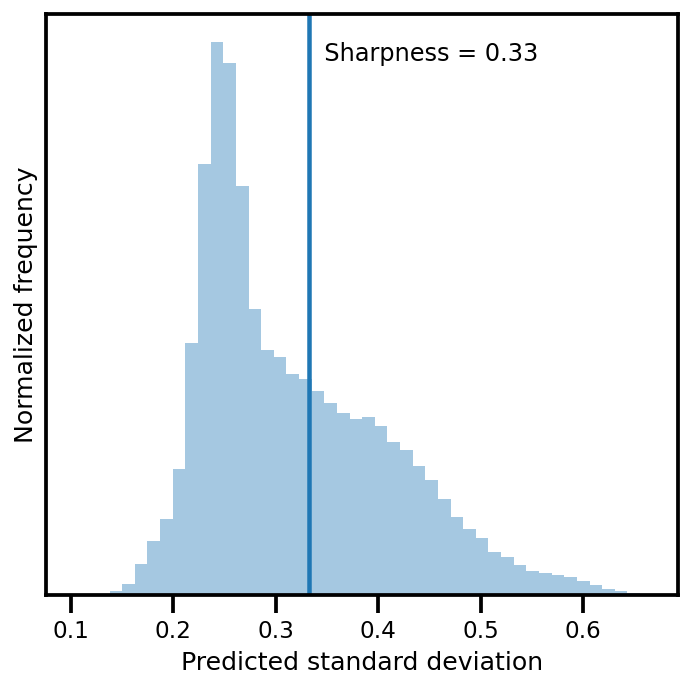

Lims is None. Setting lims now:
min_max_true: (-3.527917015966839, 1.5959772113671293)
min_max_pred: (-3.1783006, 1.6412063)
lims: (-3.527917015966839, 1.6412062644958496)
lims_ext: (-4.044829344013108, 2.1581185925421185)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


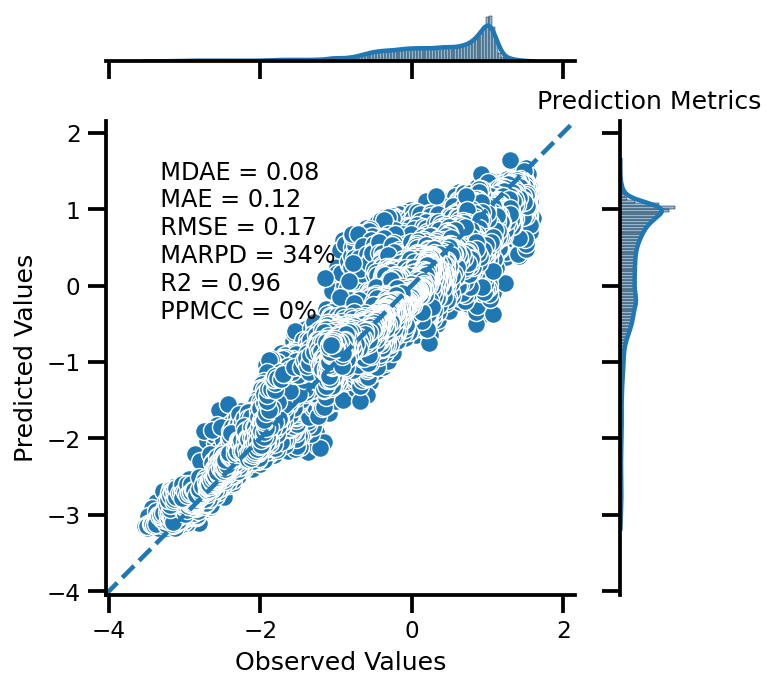

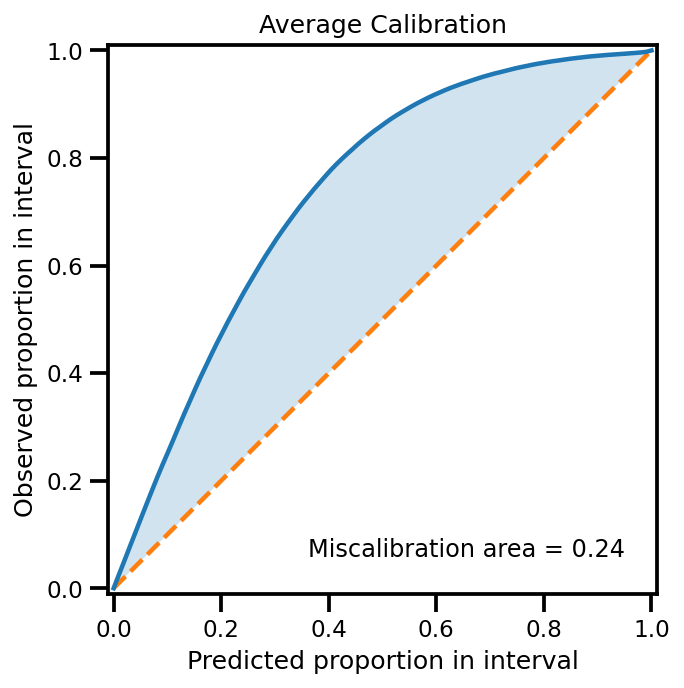

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


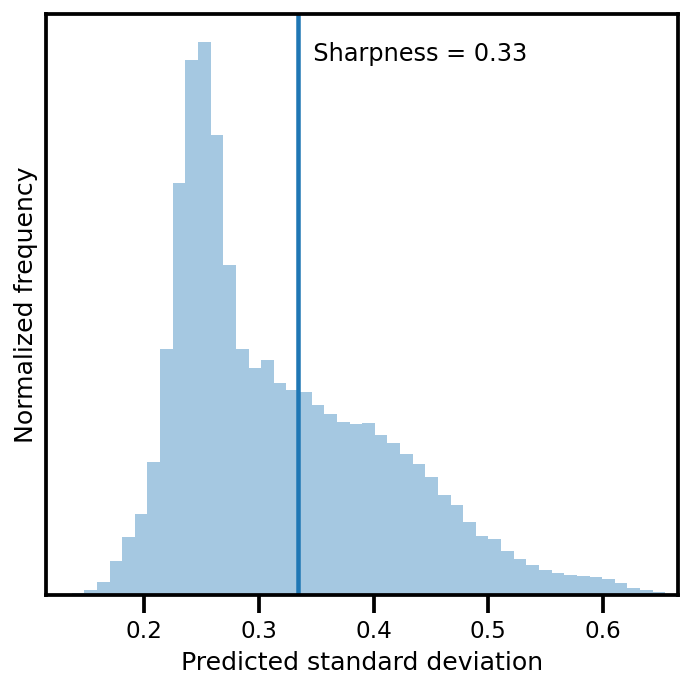

Lims is None. Setting lims now:
min_max_true: (-3.527917015966839, 1.5959772113671293)
min_max_pred: (-3.2288182, 1.672778)
lims: (-3.527917015966839, 1.6727780103683472)
lims_ext: (-4.047986518600357, 2.192847513001866)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


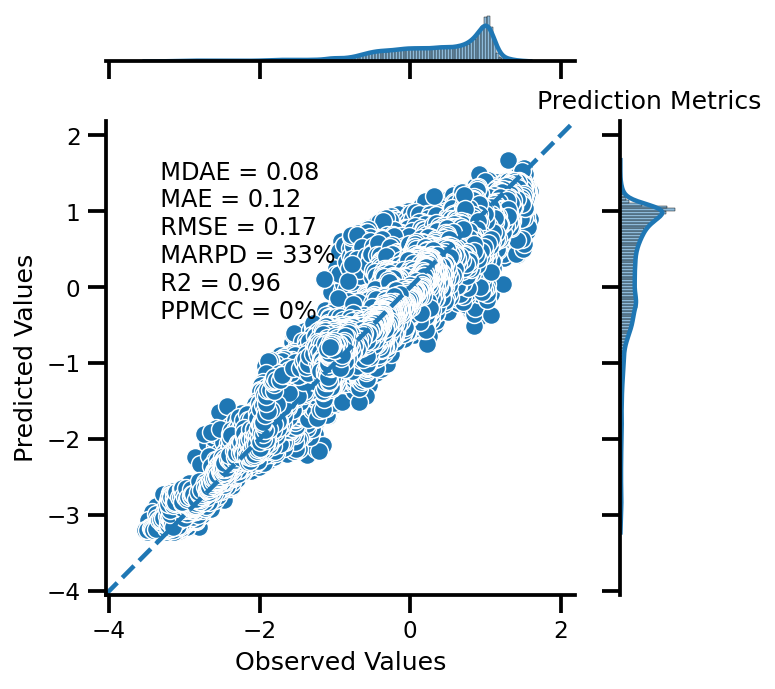

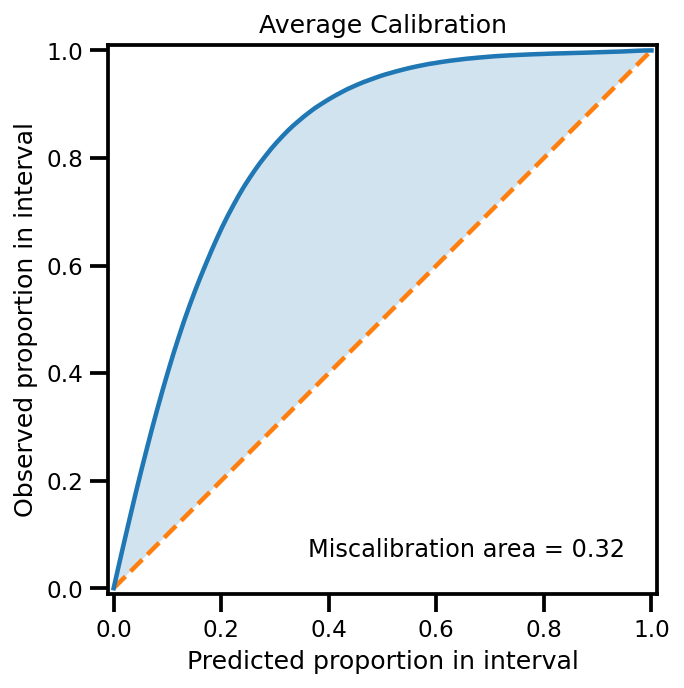

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


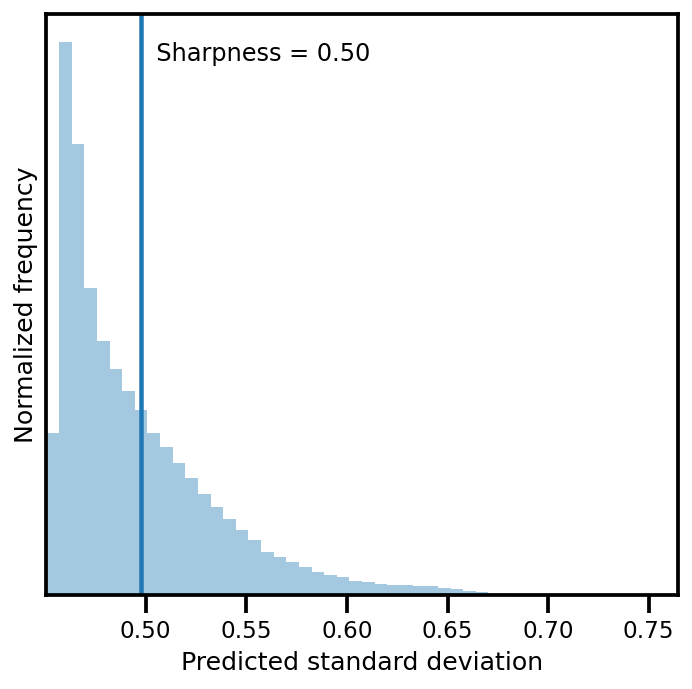

Lims is None. Setting lims now:
min_max_true: (-3.527917015966839, 1.5959772113671293)
min_max_pred: (-3.1772356, 1.6397251)
lims: (-3.527917015966839, 1.6397250890731812)
lims_ext: (-4.044681226470841, 2.156489299577183)


/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


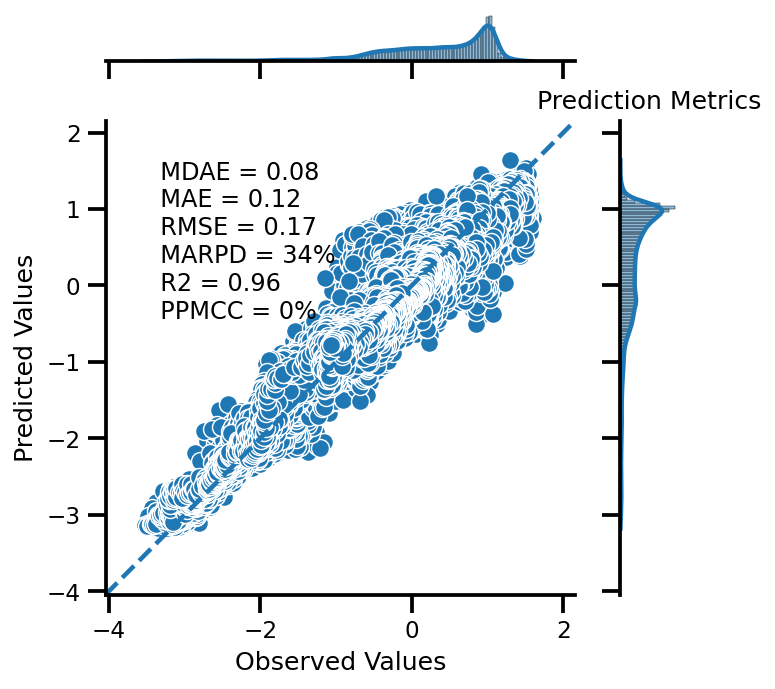

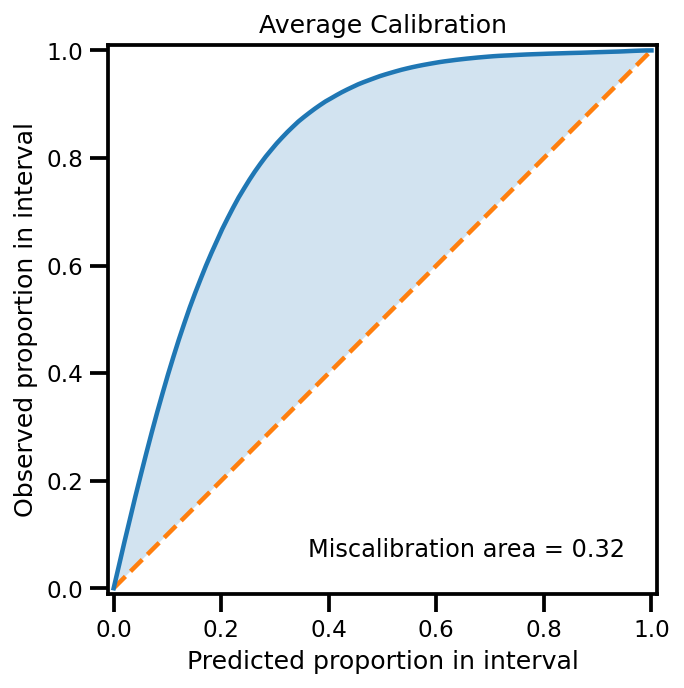

/home/emmanuel/.conda/envs/jax_py38/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


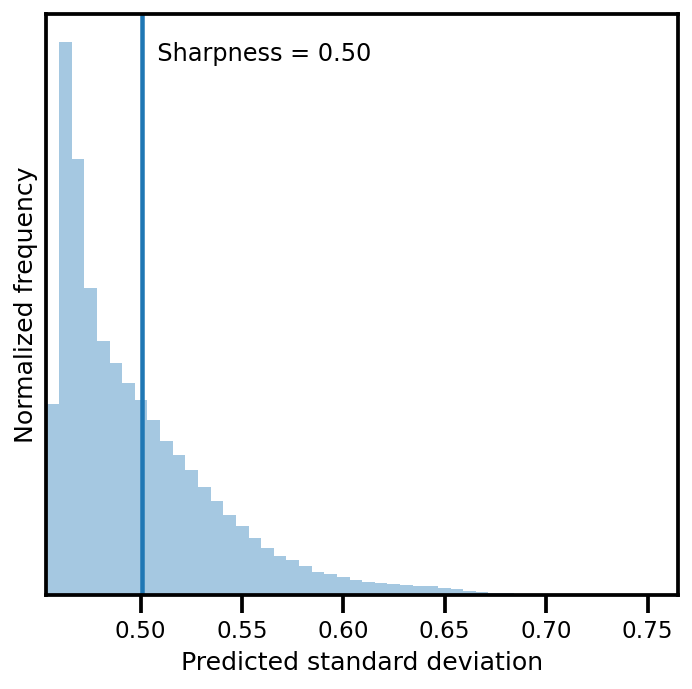

In [68]:
for imodel in ["standard", "mc", "unc", "taylor1", "taylor2"]:


    plot_all_uncertainty(
        results_df.loc[:, :, imodel].mus.values, 
        results_df.loc[:, :, imodel].stds.values, 
        results_df.loc[:, :, imodel].true.values, 
        model=imodel, data="real", log=True
    )